```
phase_pipeline
│
├── Current sensor variables
├── Sensor lag features
├── Sensor rolling features
├── Sensor slope features
├── Latest separator phase rate
├── Days since separator test
├── Latest separator GOR/WCUT
├── Shutdown and uptime features
├── Calendar features
├── Missing-value handling
├── Scaling, when required
└── Phase-specific model
```


# IMPORTS

In [1]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator

#sklearn
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
#from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import PolynomialFeatures
#from sklearn import set_config
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
from sklearn.base import clone
from sklearn.compose import TransformedTargetRegressor
#from sklearn.linear_model import MultiTaskLasso
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
#from sklearn.linear_model import MultiTaskElasticNet


# feature engine
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.timeseries.forecasting import WindowFeatures
from feature_engine.timeseries.forecasting import ExpandingWindowFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.selection import DropFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.creation import CyclicalFeatures


# light GBM
from lightgbm import LGBMRegressor

# sktime
from sktime.transformations.series.time_since import TimeSince


# statsmodels
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import ccf
from statsmodels.tsa.seasonal import STL

# optuna and other optimizatopm
import optuna

#
import time

#
from joblib import Parallel, delayed

In [2]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [3]:
# helper function imports & Class
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from basic_helper_functions import plot_clean_plot

from Feature_Engineering_Multi import GOR_WCUT_Transformer
from Feature_Engineering_Multi import plot_ccf,lag_plot 
from Feature_Engineering_Multi import MultiPhaseMultiOutputLassoSelectedLagFeatureAdder

from Feature_Engineering_Multi import TrendFeatureAdder
from Feature_Engineering_Multi import AddSelectedCalendarFourierFeaturesMultiPhase
from Feature_Engineering_Multi import ProductionCurveFeatureAdder
from Feature_Engineering_Multi import AddSpecificLag1Features

#from Machine_Learning_Multi import recursive_forecast_multiphase
#from Machine_Learning_Multi import walk_forward_recursive_forecast_multiphase
#from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics
#from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics
#from Machine_Learning_Multi import _unwrap_outer_model
#from Machine_Learning_Multi import _unwrap_single_target_estimator
#from Machine_Learning_Multi import get_multioutput_tree_feature_importance


from Feature_Engineering import AddSelectedCalendarFourierFeatures
from Feature_Engineering import RollingSlopeFeatures
#from Machine_Learning import plot_train_val_predictions_time
#from Machine_Learning import plot_train_val_actual_vs_predicted_crossplot

#from Machine_Learning import create_model_results_table
#from Machine_Learning import add_model_result
#from Machine_Learning import style_model_results_table

from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics
from Machine_Learning_Multi import recursive_forecast_multiphase
from Machine_Learning_Multi import walk_forward_recursive_forecast_multiphase
from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics

# Load data

In [4]:
# load the data
df = pd.read_csv('processed_inputs/df4.csv',index_col='DATEPRD', parse_dates=True)
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df.asfreq('D')
# drop ,'GOR_MSCF_STB', 'WCUT. I calculated this before in my helper function. But i need to calculate as part of a pipeline. so i will need to drop it
df = df.drop(columns=['GOR_MSCF_STB', 'WCUT'])

In [5]:
(df.columns,len(df.columns))

(Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
        'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
        'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
        'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'BORE_WI_VOL_STB_D', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
       dtype='object'),
 23)

# Preprocessing

In the preprocessing I am going to:
1. Remove all columns that have zeros or nan greater than 50% of the data
2. Make negative values zero
3. Then if any columns have nan, prints the column and the nan and then do linear interpolation

how many nans before cleaning
WELL_BORE_CODE                   0
NPD_WELL_BORE_CODE               0
NPD_WELL_BORE_NAME               0
NPD_FIELD_CODE                   0
NPD_FIELD_NAME                   0
NPD_FACILITY_CODE                0
NPD_FACILITY_NAME                0
ON_STREAM_HRS                    0
AVG_CHOKE_SIZE_P               196
AVG_CHOKE_UOM                    0
FLOW_KIND                        0
WELL_TYPE                        0
AVG_DOWNHOLE_PRESSURE_PSI        6
AVG_DOWNHOLE_TEMPERATURE_F       6
AVG_DP_TUBING_PSI                6
AVG_ANNULUS_PRESS_PSI          523
DP_CHOKE_SIZE_PSI                0
AVG_WHP_P_PSI                    0
BORE_WI_VOL_STB_D             3056
AVG_WHT_P                        0
BORE_OIL_VOL_STB_D               0
BORE_GAS_VOL_MSCF_D              0
BORE_WAT_VOL_STB_D               0
dtype: int64
Plot before cleaning


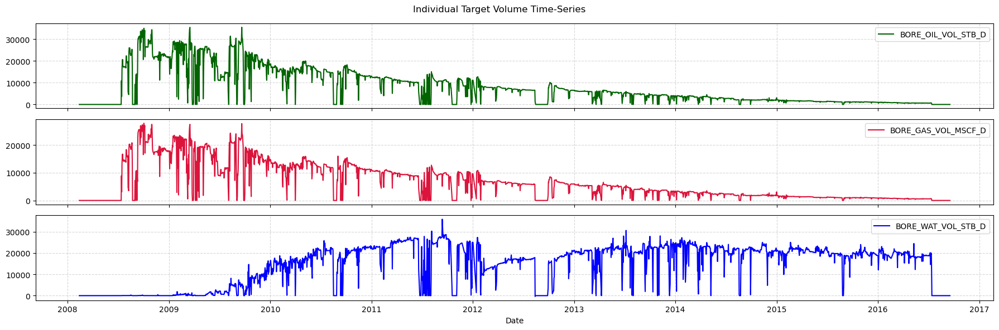

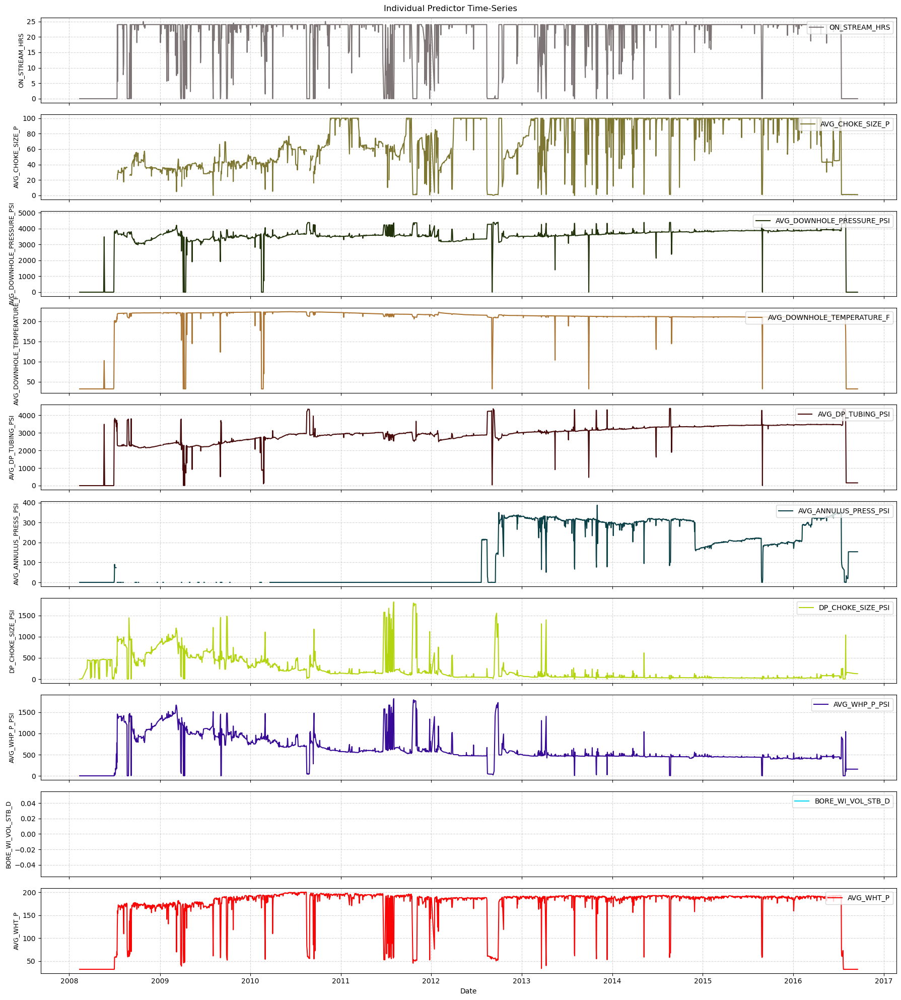

Cleaning data
The length of the dataframe before cleaning is 3056
Deleted columns with nan greater than 50% of the total data: ['BORE_WI_VOL_STB_D']
Deleted columns with zero greater than 50% of the total data: []
Before cleaning, AVG_CHOKE_SIZE_P has 196 NaNs
Before cleaning, AVG_DOWNHOLE_PRESSURE_PSI has 6 NaNs
Before cleaning, AVG_DOWNHOLE_TEMPERATURE_F has 6 NaNs
Before cleaning, AVG_DP_TUBING_PSI has 6 NaNs
Before cleaning, AVG_ANNULUS_PRESS_PSI has 523 NaNs
Before cleaning, BORE_WAT_VOL_STB_D has 2 negative values
how many nans after cleaning
WELL_BORE_CODE                            0
NPD_WELL_BORE_CODE                        0
NPD_WELL_BORE_NAME                        0
NPD_FIELD_CODE                            0
NPD_FIELD_NAME                            0
NPD_FACILITY_CODE                         0
NPD_FACILITY_NAME                         0
ON_STREAM_HRS                             0
AVG_CHOKE_SIZE_P                          0
AVG_CHOKE_UOM                             0
FLOW_

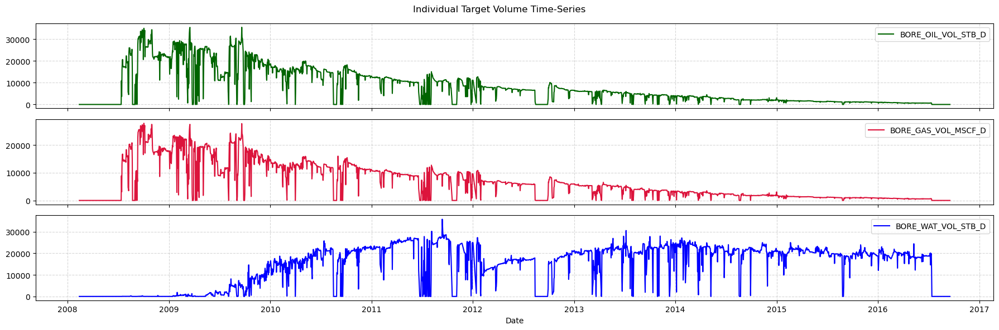

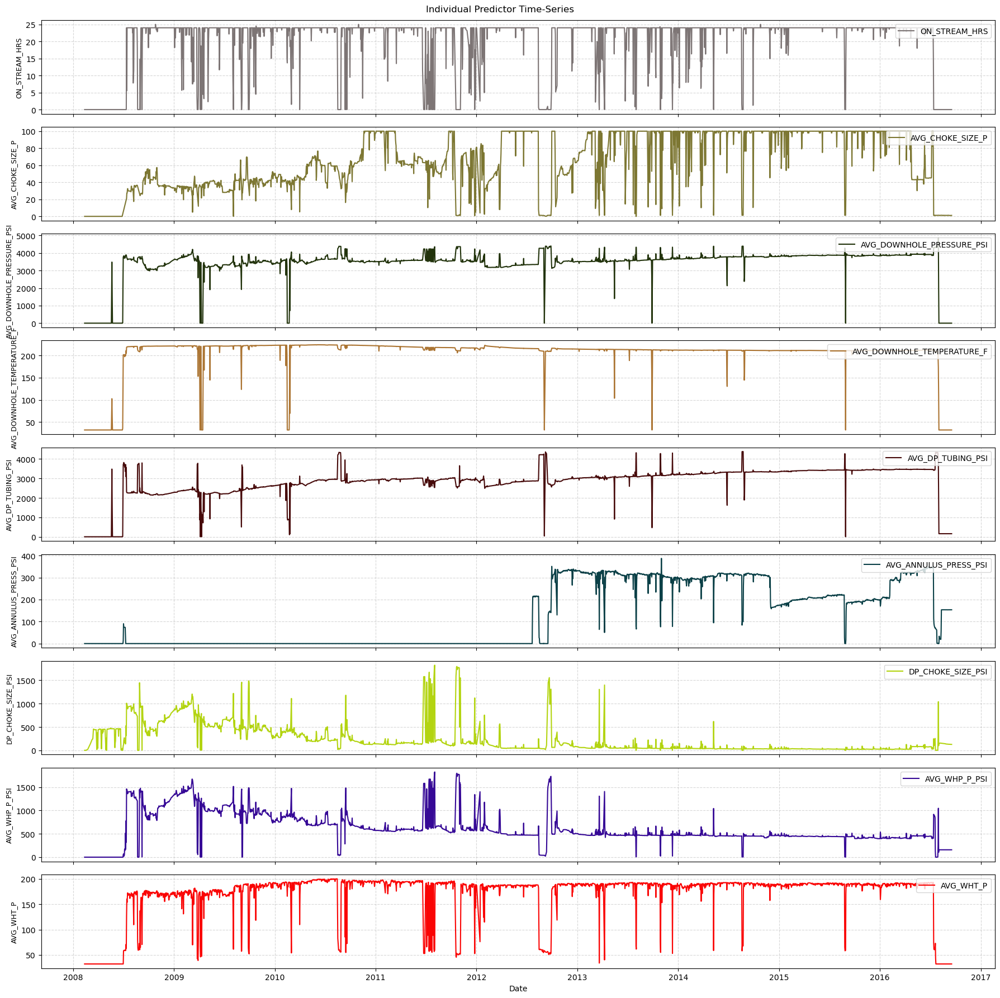

In [6]:
# dropped_nan_cols columns that have nan with more than 50% 
# dropped_zero_cols columns that have zeros with more than 50%
#missing_indicator_cols list of columns that tells us the column nan was changed using linear interpolation
#negative_indicator_cols   #list of columns that tells us the columns with negative values was set to zero

df, dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols=plot_clean_plot(df)

In [7]:
df.columns

Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
       'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
       'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'AVG_CHOKE_SIZE_P_WAS_MISSING',
       'AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
       'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
       'AVG_DP_TUBING_PSI_WAS_MISSING', 'AVG_ANNULUS_PRESS_PSI_WAS_MISSING',
       'BORE_WAT_VOL_STB_D_WAS_NEGATIVE'],
      dtype='object')

In [8]:
# just to see the columns that were drops
dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols

(['BORE_WI_VOL_STB_D'],
 [],
 ['AVG_CHOKE_SIZE_P_WAS_MISSING',
  'AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
  'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
  'AVG_DP_TUBING_PSI_WAS_MISSING',
  'AVG_ANNULUS_PRESS_PSI_WAS_MISSING'],
 ['BORE_WAT_VOL_STB_D_WAS_NEGATIVE'])

In [11]:
# drop indicator columns
df = df.drop(columns=missing_indicator_cols,errors='ignore')
df = df.drop(columns=negative_indicator_cols,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.000870,0.963052,0.000000,32.0,0.0,0.0,0.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,0.000870,1.519853,0.000000,32.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,153.488784,129.002164,157.704894,32.0,0.0,0.0,0.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,153.495311,128.904988,157.757688,32.0,0.0,0.0,0.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,153.480227,128.446523,157.841520,32.0,0.0,0.0,0.0


In [12]:
# drop columns not needed
cols_to_drop = ['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
                'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
                'NPD_FACILITY_NAME',"AVG_CHOKE_UOM",'FLOW_KIND', 'WELL_TYPE']
df = df.drop(columns=cols_to_drop,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.000870,0.963052,0.000000,32.0,0.0,0.0,0.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,0.000870,1.519853,0.000000,32.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,153.488784,129.002164,157.704894,32.0,0.0,0.0,0.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,153.495311,128.904988,157.757688,32.0,0.0,0.0,0.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,153.480227,128.446523,157.841520,32.0,0.0,0.0,0.0


In [13]:
#################################################
#
# DROP AVG_ANNULUS_PRESS_PSI
#
###################################################


df.drop(columns=["AVG_ANNULUS_PRESS_PSI"], errors='ignore', inplace=True)
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,0.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,0.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,0.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,0.0


In [14]:
#Find the missing dates
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,
2008-04-29,2008-04-29,2008-04-27,2 days
2008-08-08,2008-08-08,2008-08-06,2 days
2009-05-06,2009-05-06,2009-05-04,2 days
2009-08-04,2009-08-04,2009-08-02,2 days
2009-09-02,2009-09-02,2009-08-31,2 days
2010-03-02,2010-03-02,2010-02-27,3 days
2010-03-08,2010-03-08,2010-03-06,2 days
2010-08-17,2010-08-17,2010-08-15,2 days
2010-08-20,2010-08-20,2010-08-17,3 days


In [15]:
# force reindex to daily
df_daily = df.copy()
df.index = pd.to_datetime(df.index)
df = df.sort_index()

df= df.asfreq("D")

In [16]:
# Find the missing dates again
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,


In [17]:
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,
2008-04-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-05-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-08-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2013-06-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
# set all nans to zeros
df.fillna(0, inplace=True)
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,


In [19]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [20]:
# drop the choke column to see what happens
#df.drop("AVG_CHOKE_SIZE_P", axis=1, inplace=True)


# Feature Engineering Steps
This steps is for making and testing the pipeline. It uses all the data. Again it is only for making sure the pipepline works

## 2 Lag Selection

### 2.1 Seasonal Plots

The selection is just to plot to see what seasonal pattern I see. I going to use this later in 5 where I actually create features for these seasonal patterns

In [19]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D'],
      dtype='object')

#### Day of the week seasonal pattern

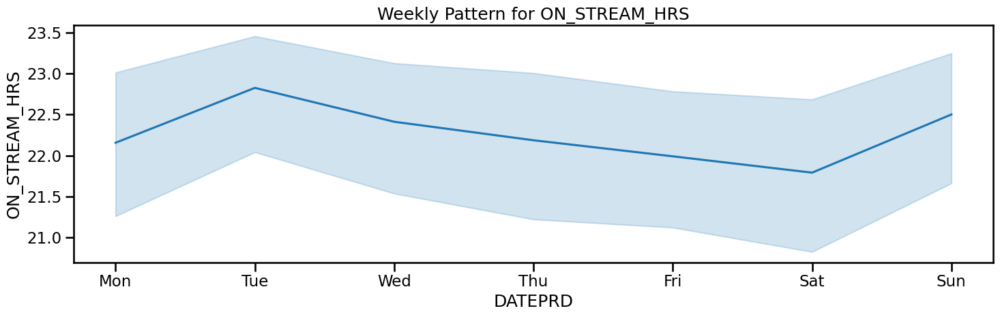

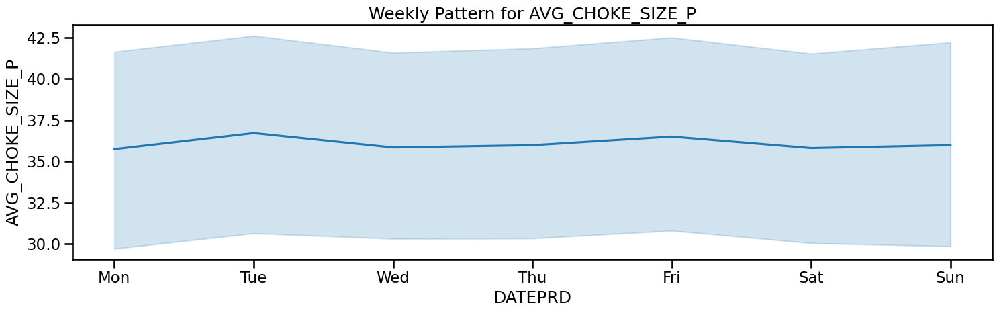

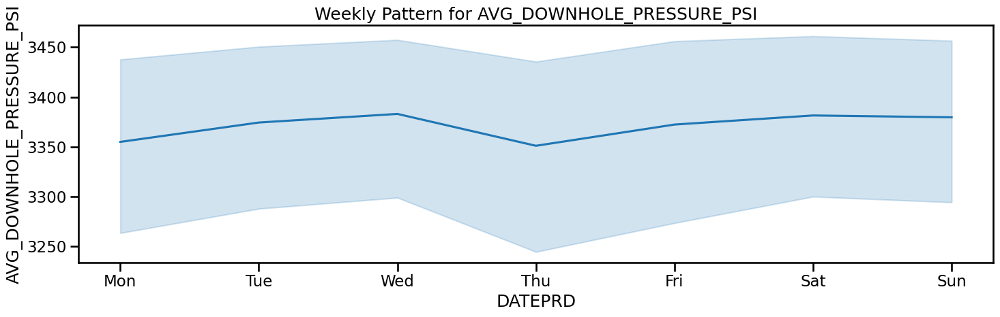

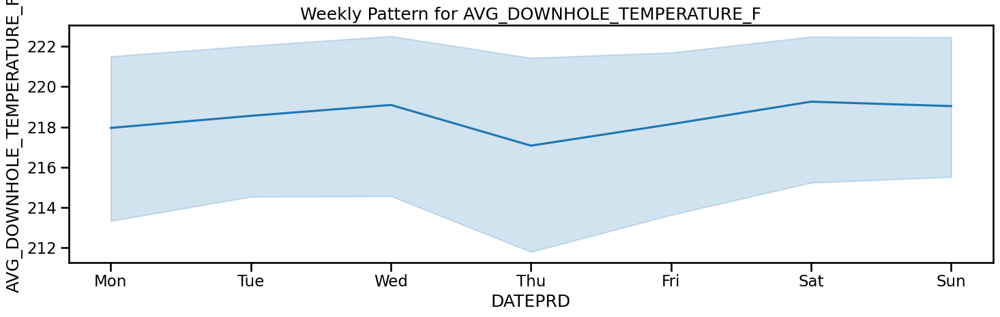

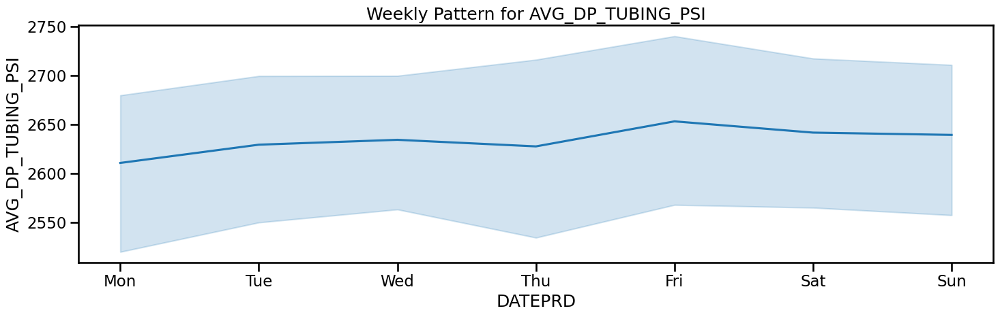

...

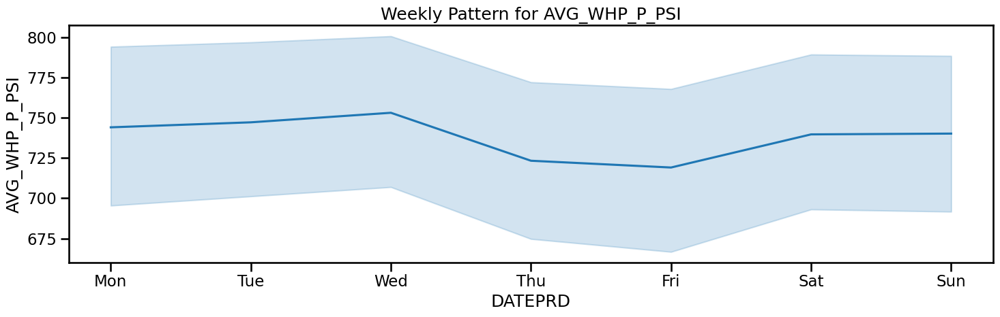

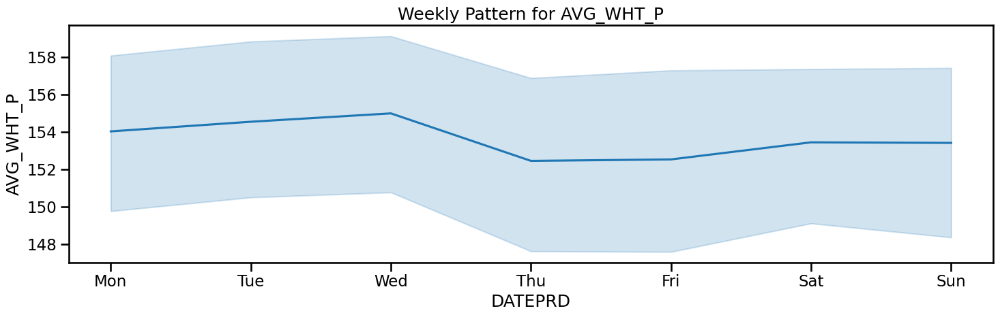

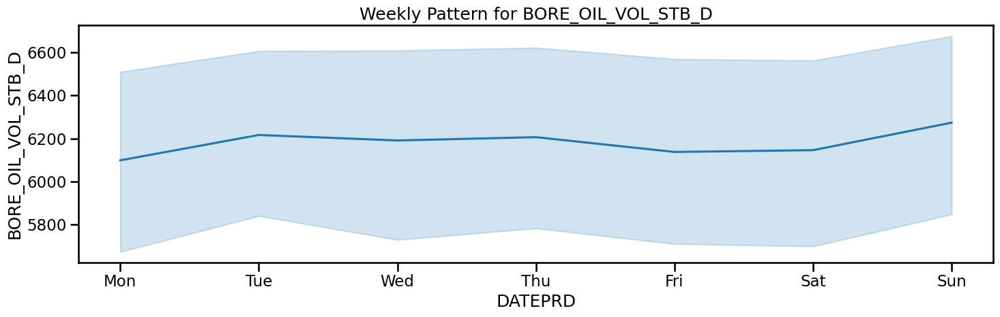

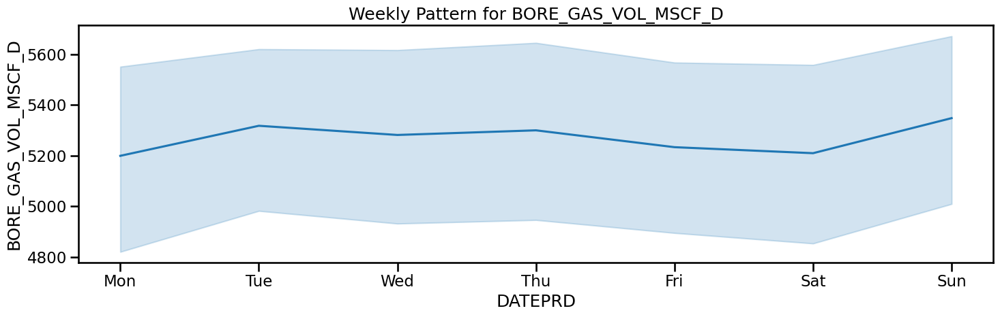

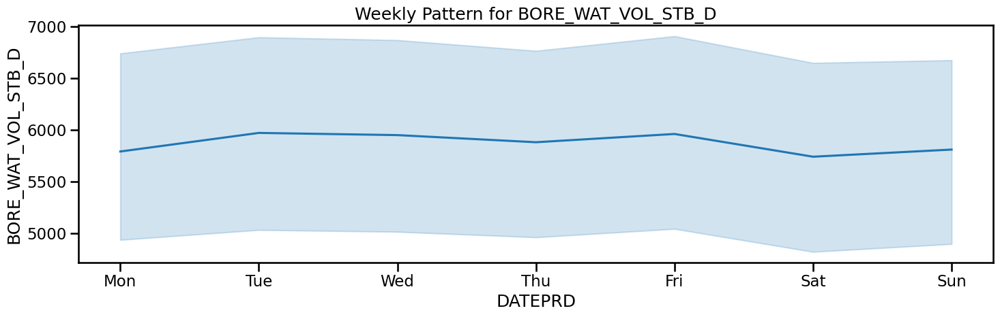

In [20]:
pd.plotting.register_matplotlib_converters()
with sns.plotting_context("talk"):

    for feat in df.columns:
    
        fig, ax = plt.subplots(figsize=[15, 5])
        
        sns.lineplot(x=df.index.dayofweek, y=df[feat], ax=ax)
        ax.set_xticks(range(7))
        ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax.set_title(f"Weekly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()  # Ensures each plot displays sequentially in the loop

I don't think there is a weekly seasonality

####  Month of the year seasonal pattern

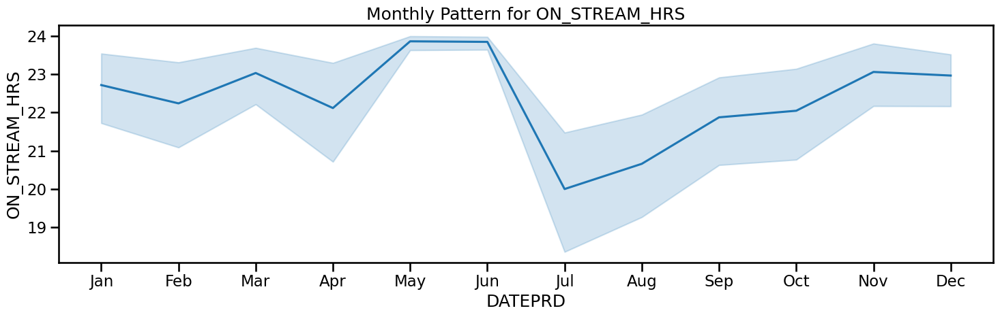

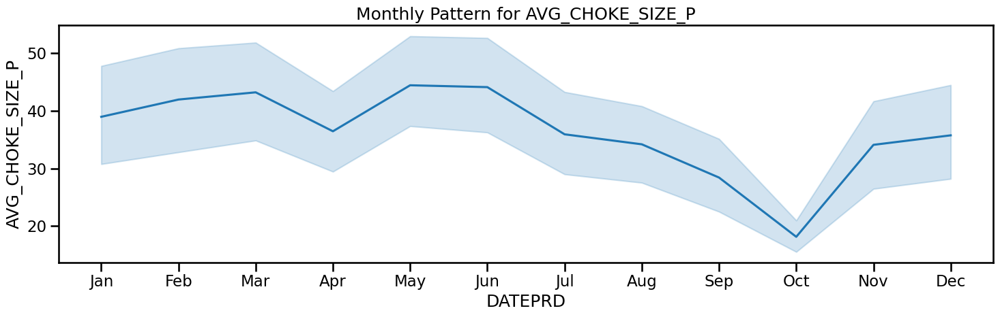

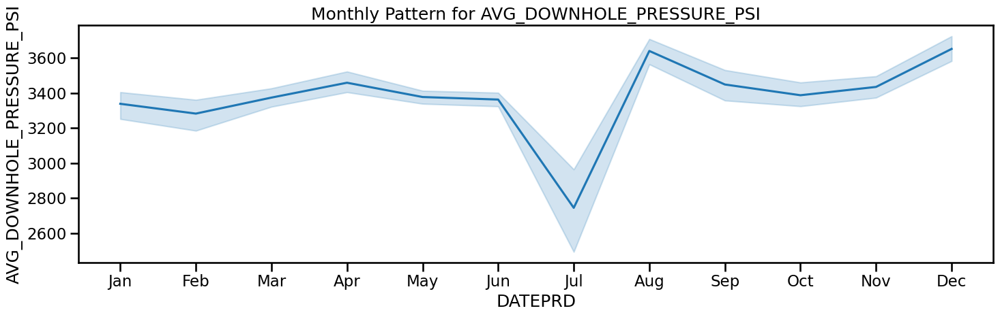

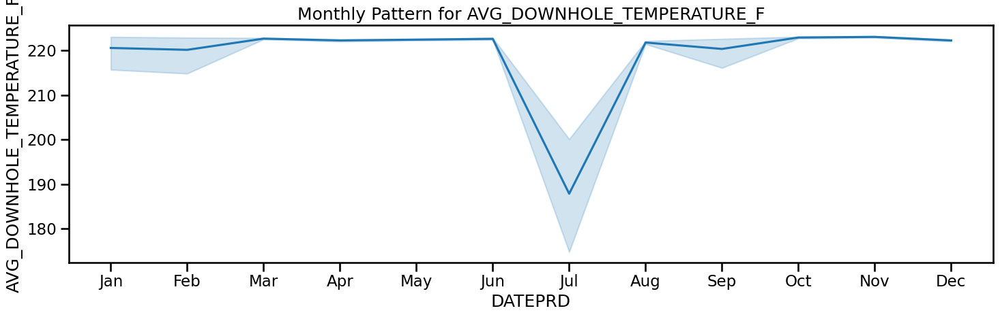

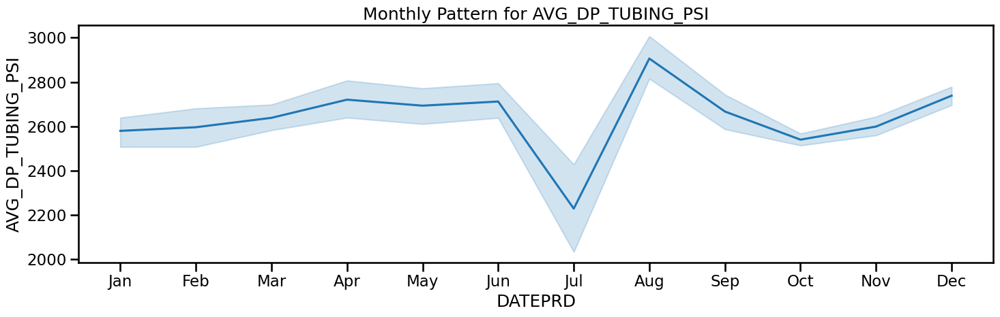

...

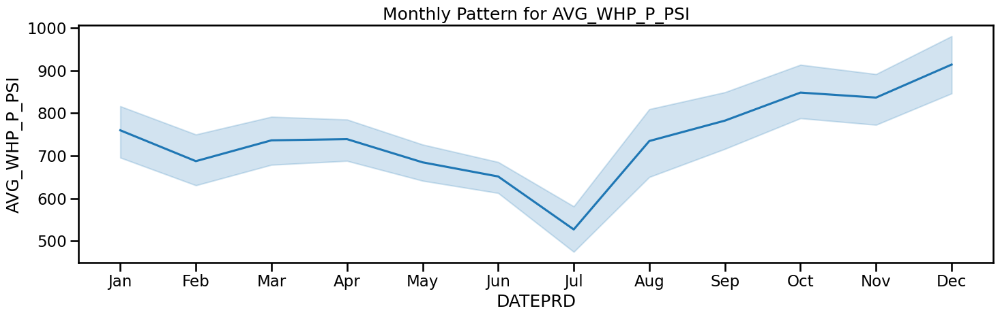

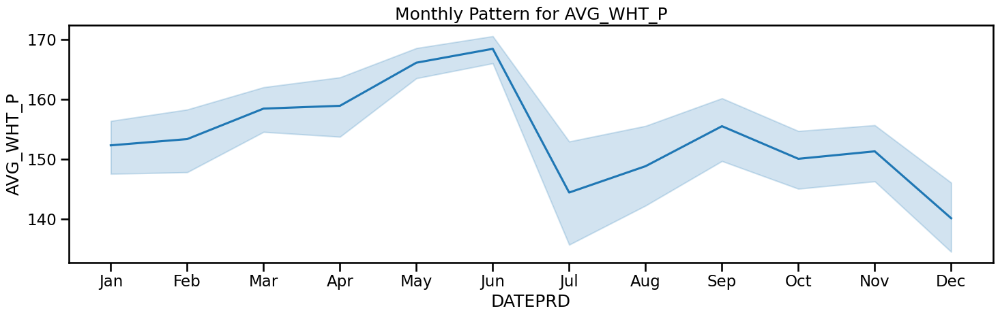

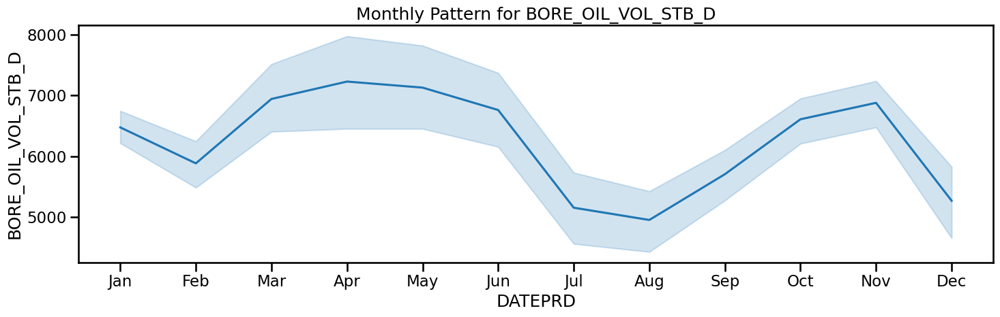

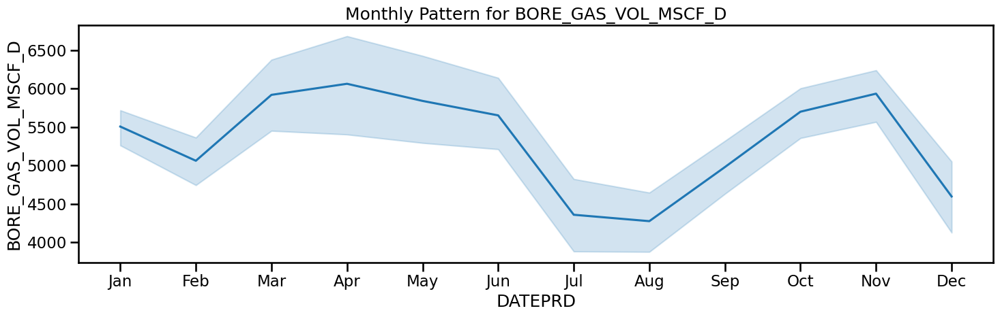

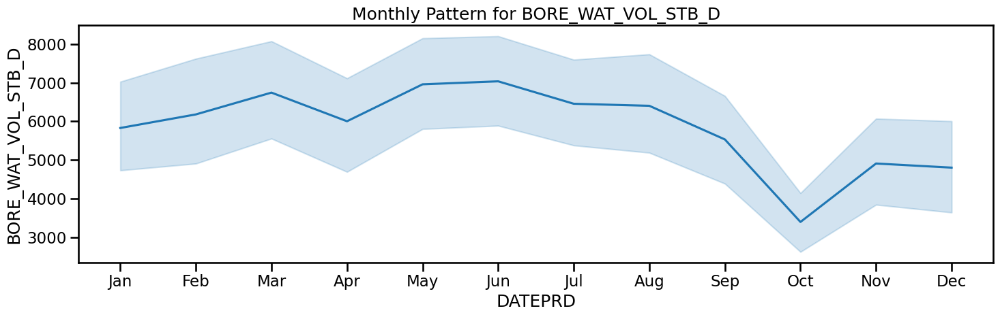

In [21]:
pd.plotting.register_matplotlib_converters()

# Using "talk" context for larger text sizing
with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Change x to df.index.month (values ranging from 1 to 12)
        sns.lineplot(x=df.index.month, y=df[feat], ax=ax)
        
        # 2. Update ticks for 12 months (1 through 12)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        
        # 3. Update the title to reflect the monthly trend
        ax.set_title(f"Monthly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()

TPerhaps a little monthly pattern. 

#### Week of the year seasonal pattern

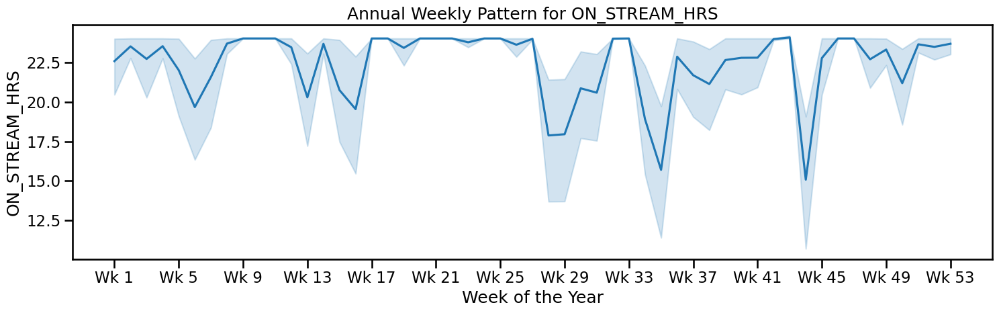

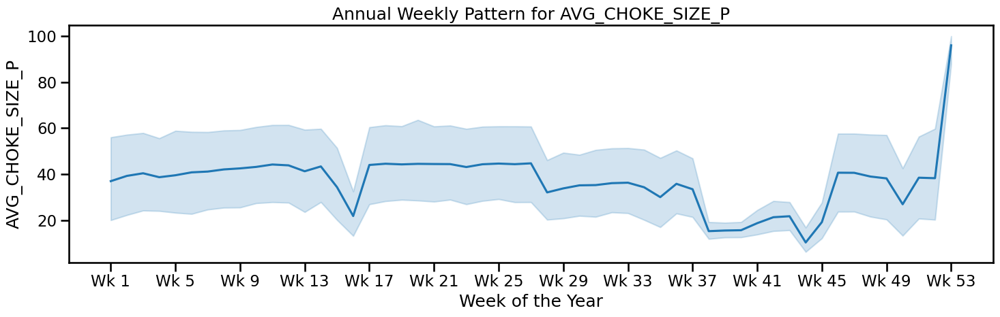

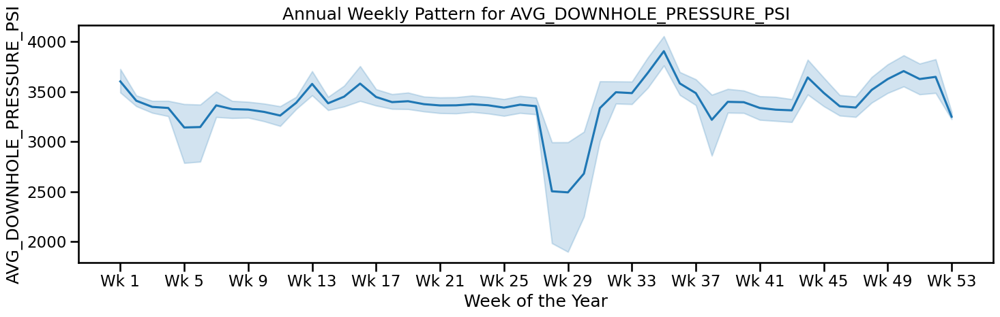

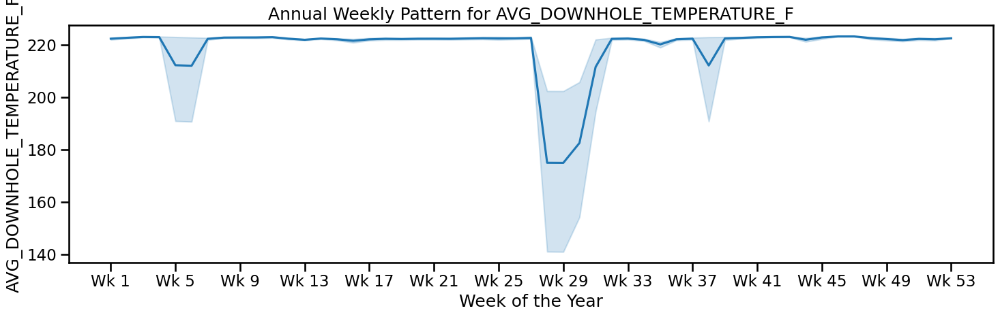

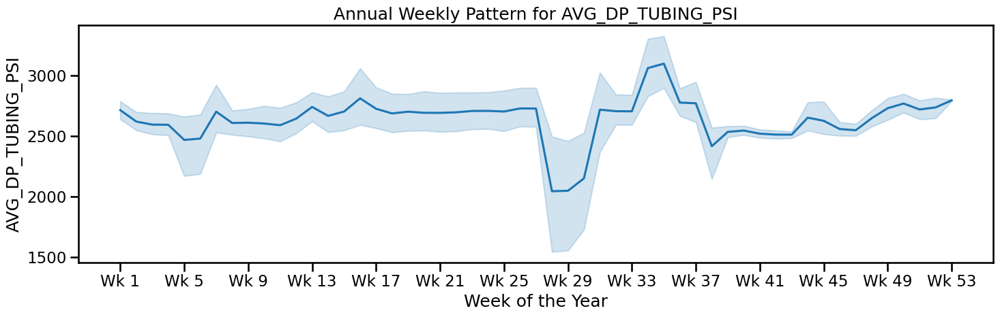

...

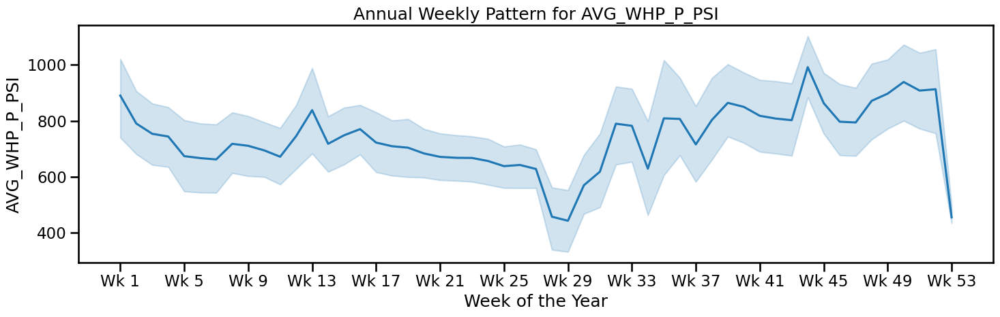

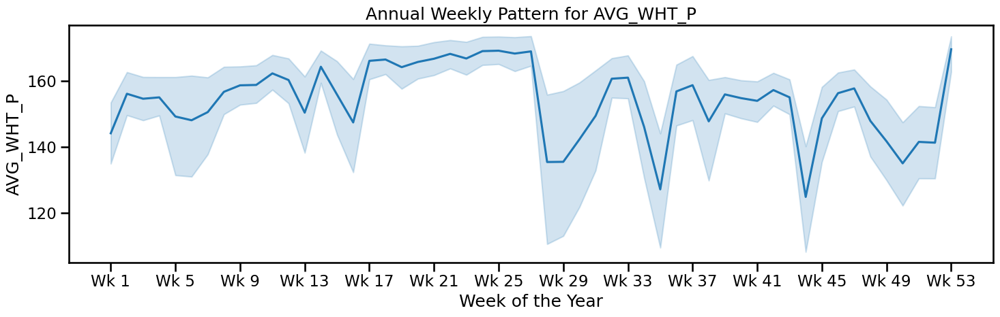

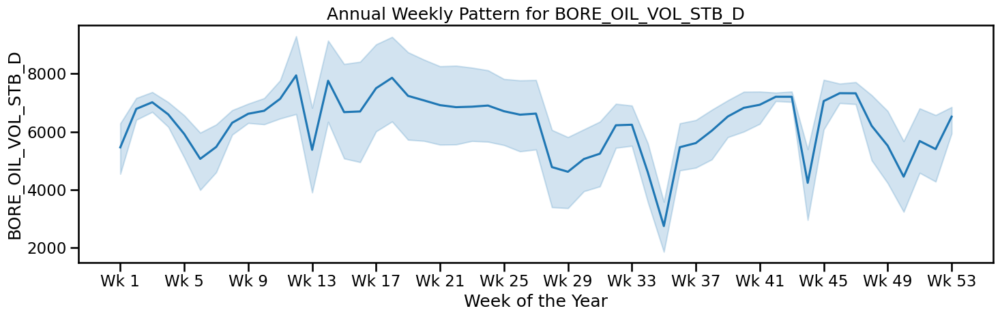

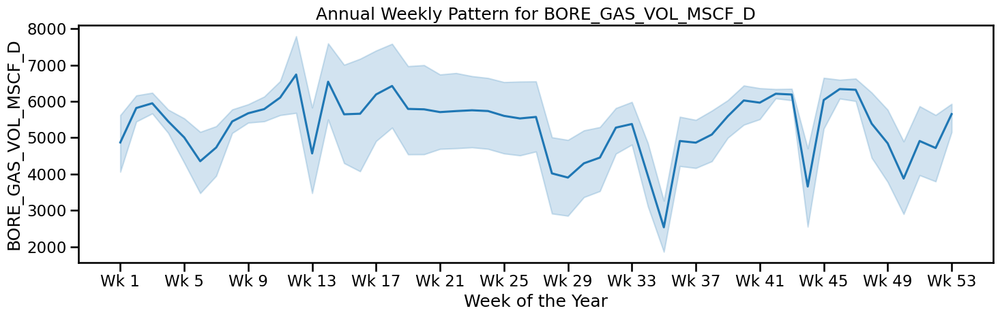

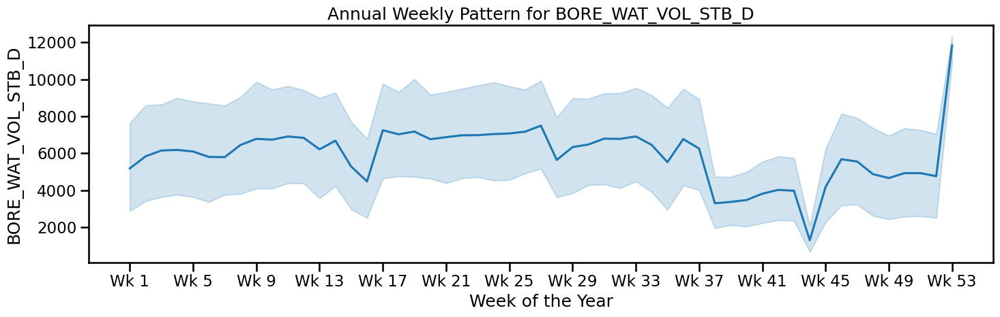

In [22]:
pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use .isocalendar().week to get week numbers (1 to 52/53)
        sns.lineplot(x=df.index.isocalendar().week, y=df[feat], ax=ax)
        
        # 2. Clean up x-axis: label every 4th week so it's readable
        week_ticks = list(range(1, 54, 4))
        ax.set_xticks(week_ticks)
        ax.set_xticklabels([f"Wk {w}" for w in week_ticks])
        
        ax.set_title(f"Annual Weekly Pattern for {feat}")
        ax.set_xlabel("Week of the Year")
        
        plt.tight_layout()
        plt.show()

Perhaps a little

#### Quater of the year seasonal pattern

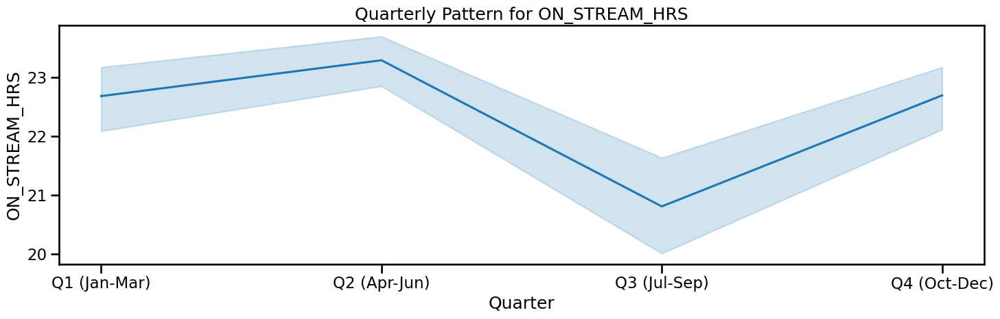

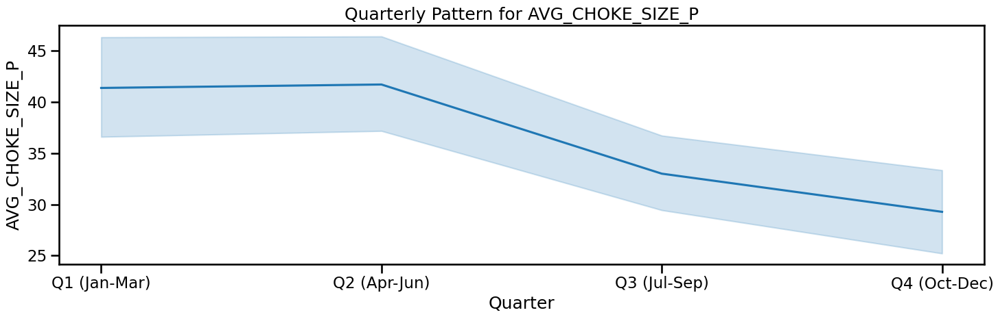

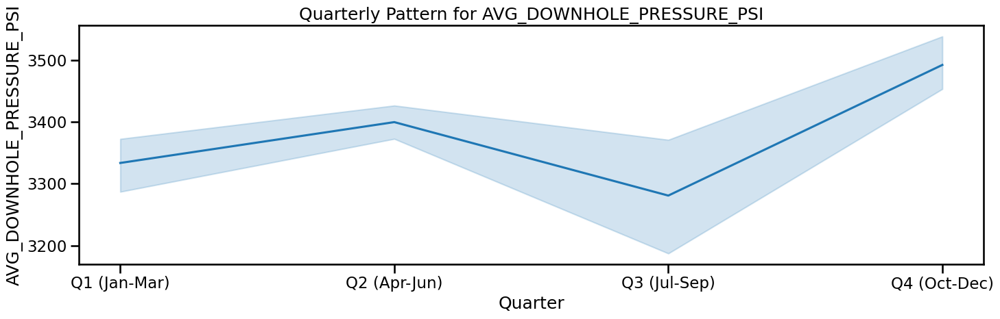

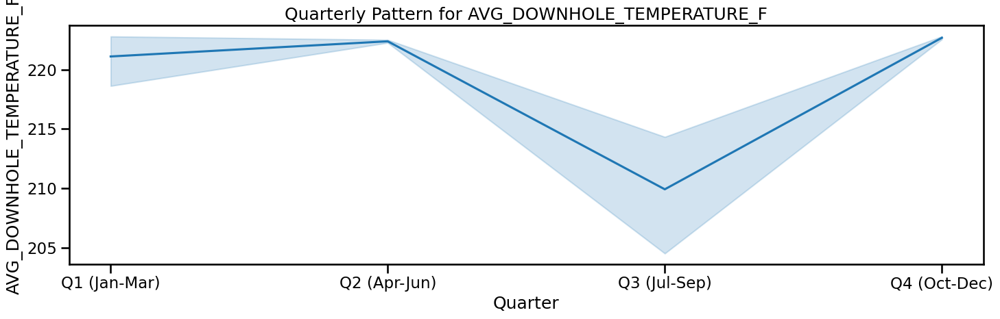

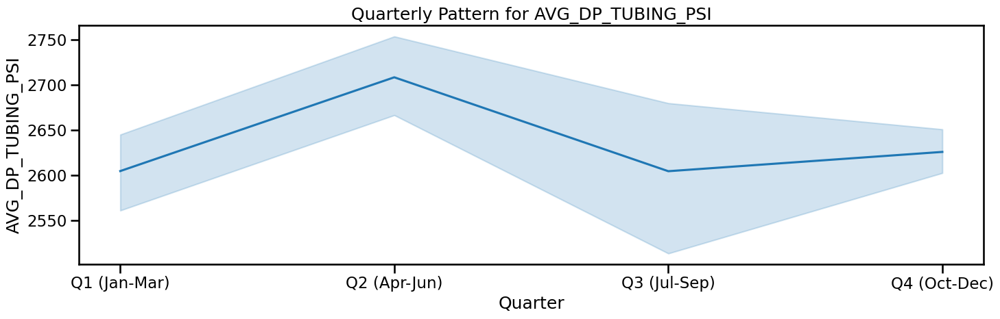

...

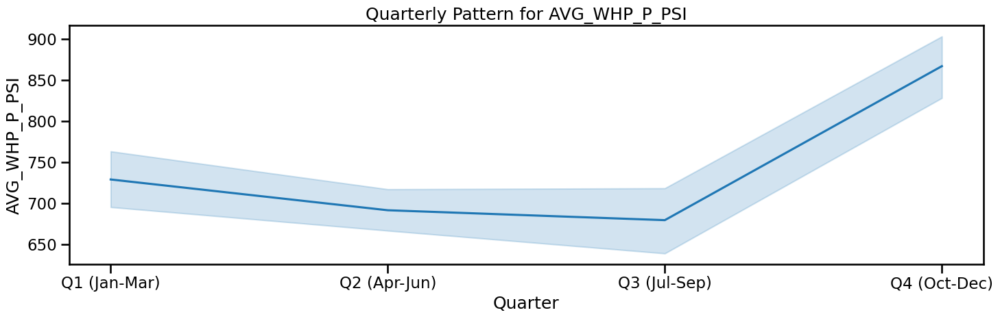

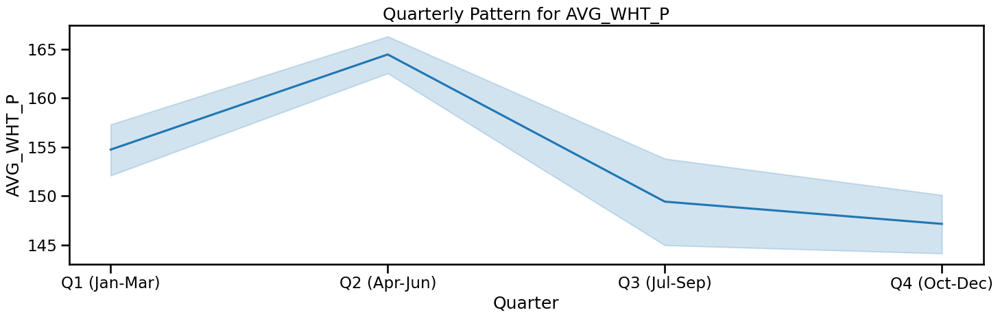

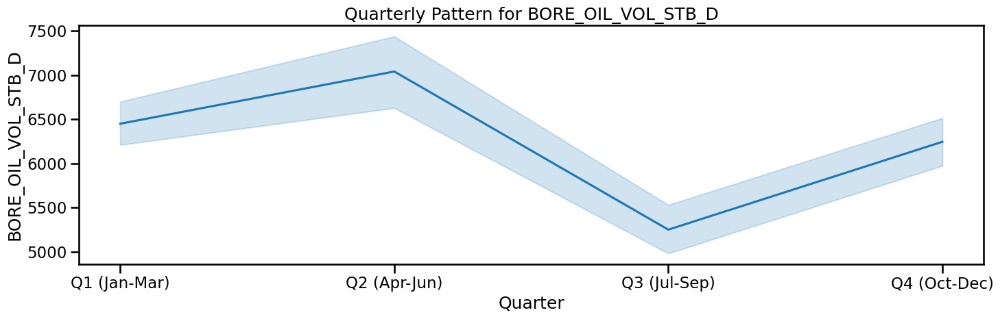

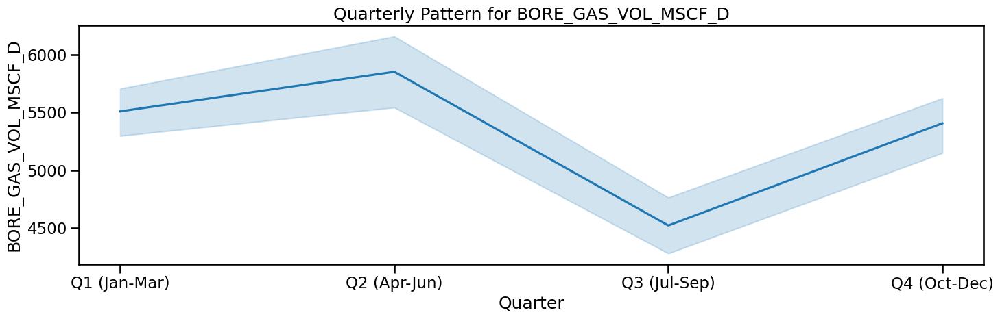

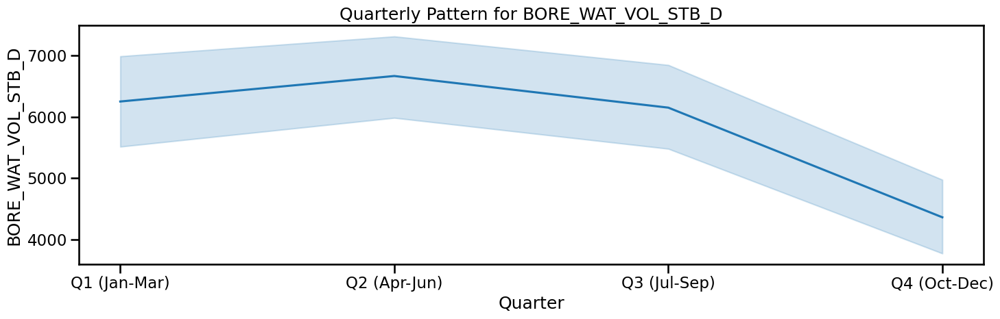

In [23]:

pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use df.index.quarter to group data into 4 chunks
        sns.lineplot(x=df.index.quarter, y=df[feat], ax=ax)
        
        # 2. Set explicit ticks for the 4 quarters
        ax.set_xticks([1, 2, 3, 4])
        ax.set_xticklabels(['Q1 (Jan-Mar)', 'Q2 (Apr-Jun)', 'Q3 (Jul-Sep)', 'Q4 (Oct-Dec)'])
        
        ax.set_title(f"Quarterly Pattern for {feat}")
        ax.set_xlabel("Quarter")
        
        plt.tight_layout()
        plt.show()

A little but not as much

I am going to use this to plot the ACF anad PACF and manually pick the lags. and force keep these lags in the lasso selector

In [24]:
df_acf_pacf=df.copy()

In [25]:
df_acf_pacf

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


#### ACF & PACF for oil

##### without removing tend or seasonality
This is not too import to look at

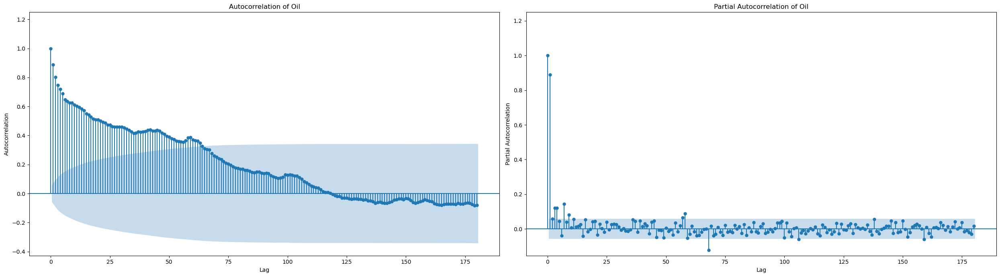

In [26]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Oil")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Oil")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend
This is not too import to look at

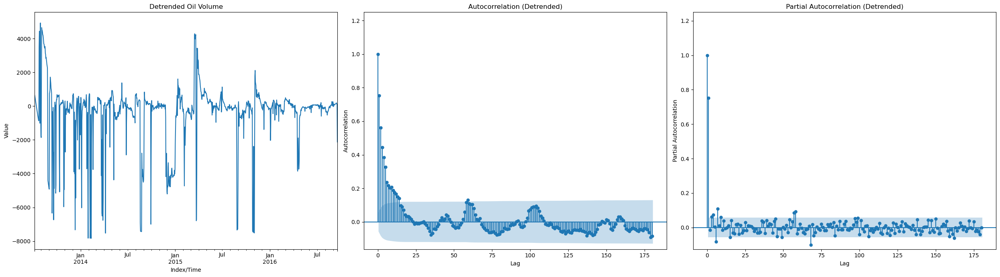

In [27]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_OIL_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_oil"] = res[:, 1]
df_acf_pacf["y_oil_detrend"] = df_acf_pacf["BORE_OIL_VOL_STB_D"] - df_acf_pacf["lowess_oil"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_oil_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Oil Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_oil_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_oil_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

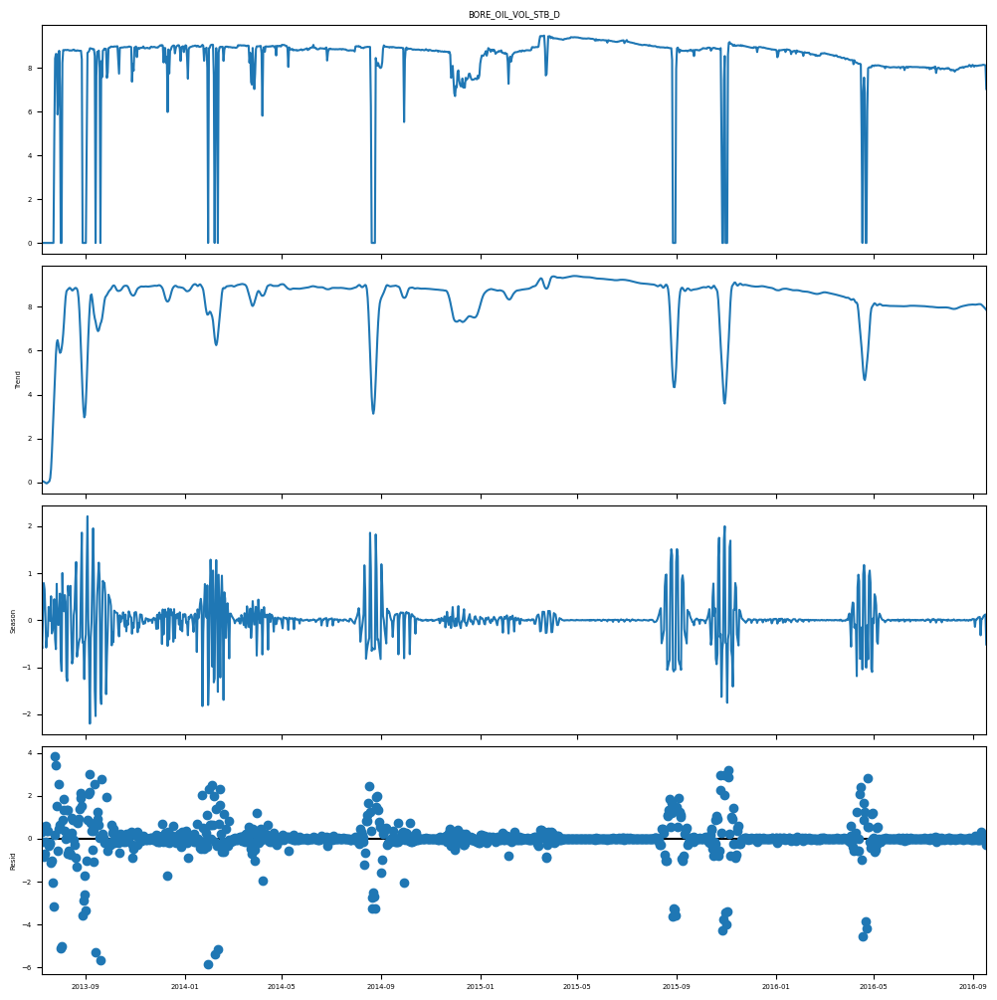

In [28]:
# Break the timeseries into trend, seasonality, and residual components
#res_oil = STL(np.log1p(df_acf_pacf["BORE_OIL_VOL_STB_D"])).fit()
res_oil = STL(np.log1p(df_acf_pacf["BORE_OIL_VOL_STB_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_oil.plot();

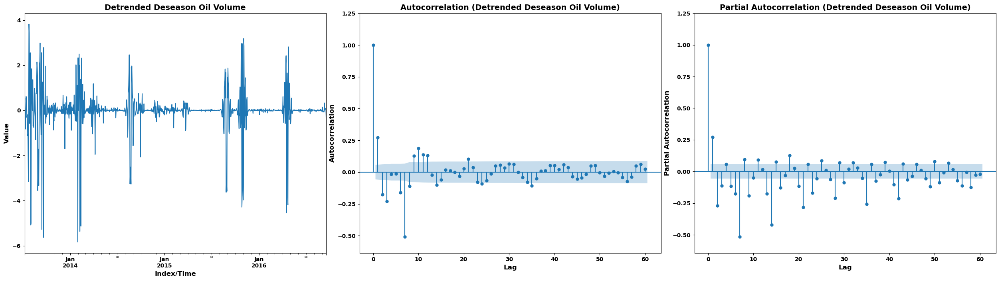

In [29]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Oil Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_oil.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_oil.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season:

#### ACF & PACF for gas

##### without removing tend or seasonality

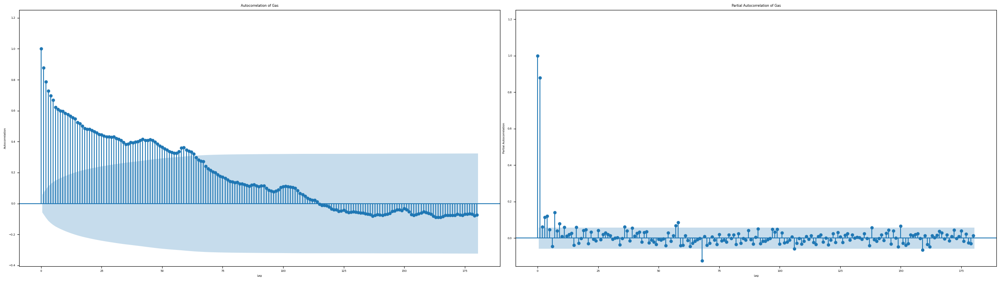

In [30]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Gas")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Gas")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

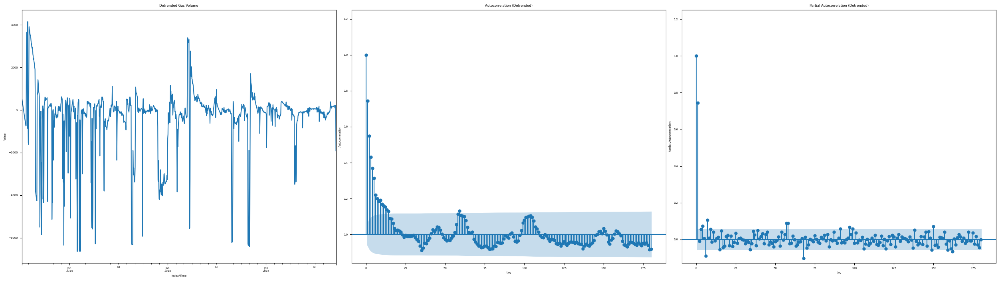

In [31]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_GAS_VOL_MSCF_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_gas"] = res[:, 1]
df_acf_pacf["y_gas_detrend"] = df_acf_pacf["BORE_GAS_VOL_MSCF_D"] - df_acf_pacf["lowess_gas"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_gas_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Gas Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_gas_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_gas_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

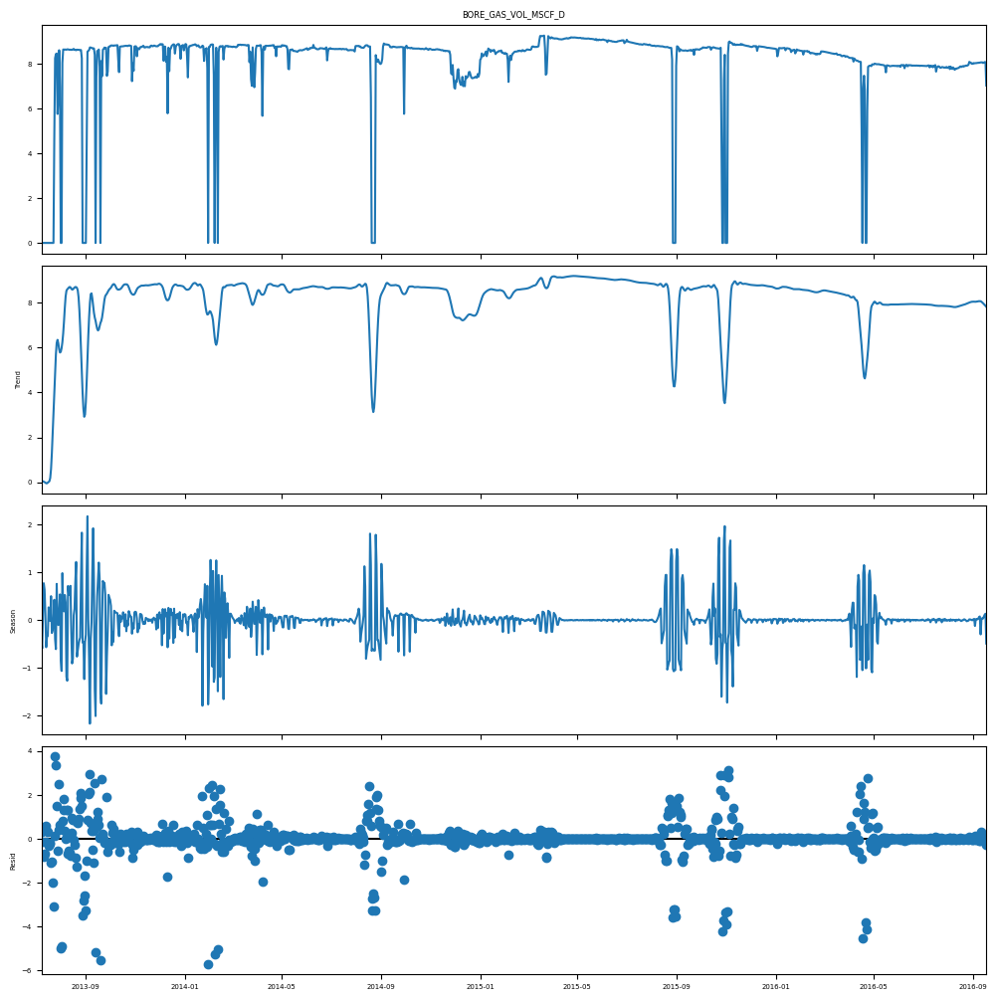

In [32]:
# Break the timeseries into trend, seasonality, and residual components
res_gas = STL(np.log1p(df_acf_pacf["BORE_GAS_VOL_MSCF_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_gas.plot();

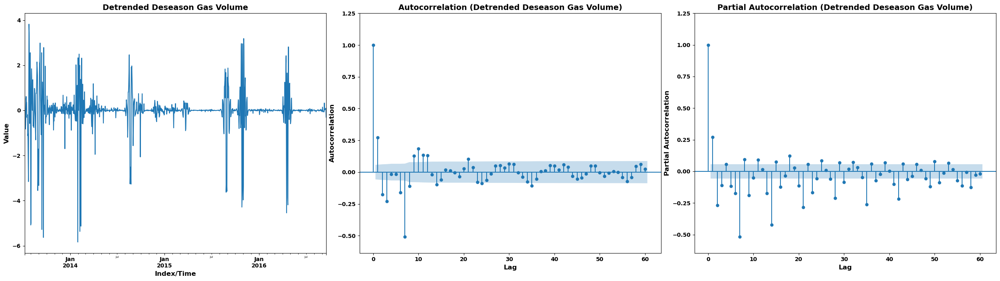

In [33]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Gas Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_gas.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_gas.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season, i should use a Lag of :

#### ACF & PACF for water

##### without removing tend or seasonality

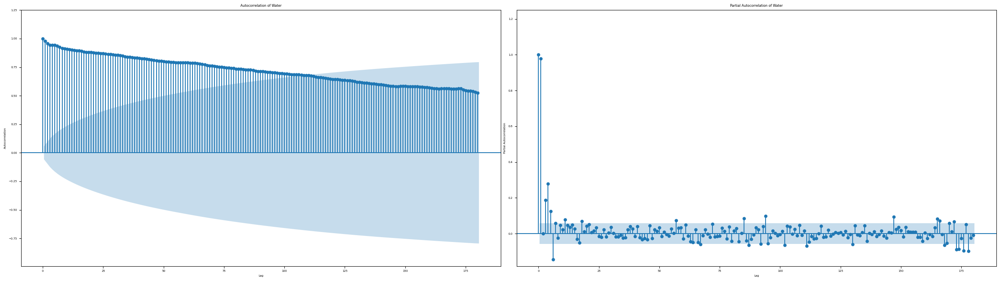

In [34]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Water")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Water")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

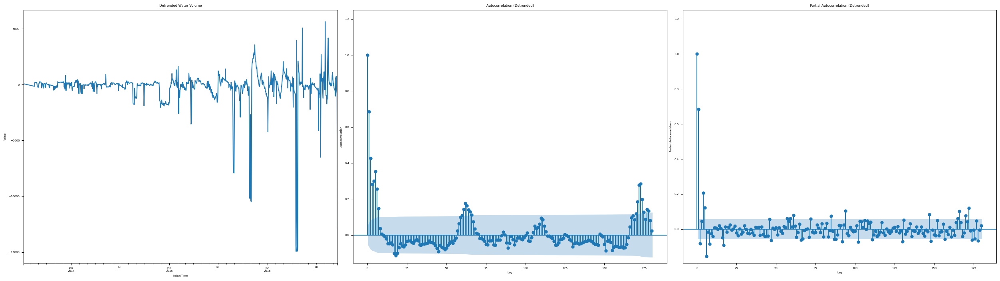

In [35]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_WAT_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_water"] = res[:, 1]
df_acf_pacf["y_water_detrend"] = df_acf_pacf["BORE_WAT_VOL_STB_D"] - df_acf_pacf["lowess_water"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_water_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Water Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_water_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_water_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

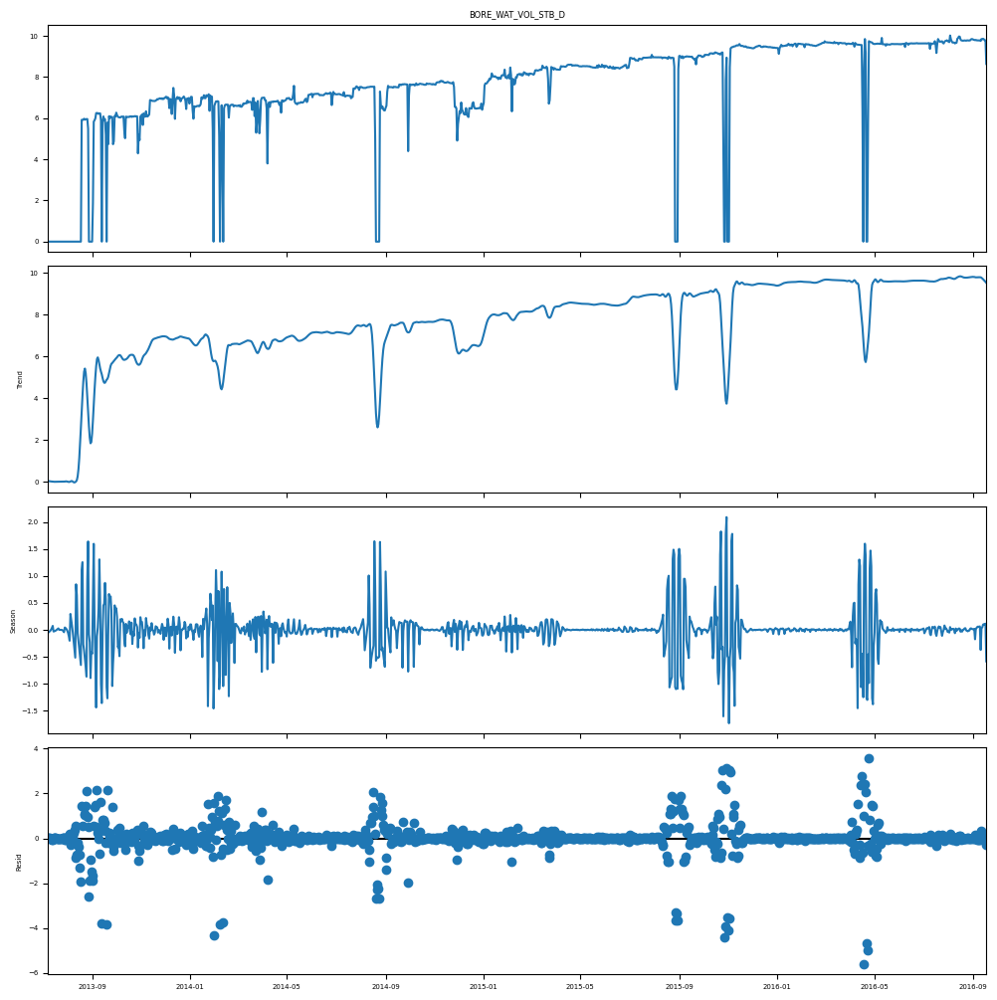

In [36]:
# Break the timeseries into trend, seasonality, and residual components
res_water = STL(np.log1p(df_acf_pacf["BORE_WAT_VOL_STB_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_water.plot();

In [37]:
# Looking at this there is definitely an issue with the variance

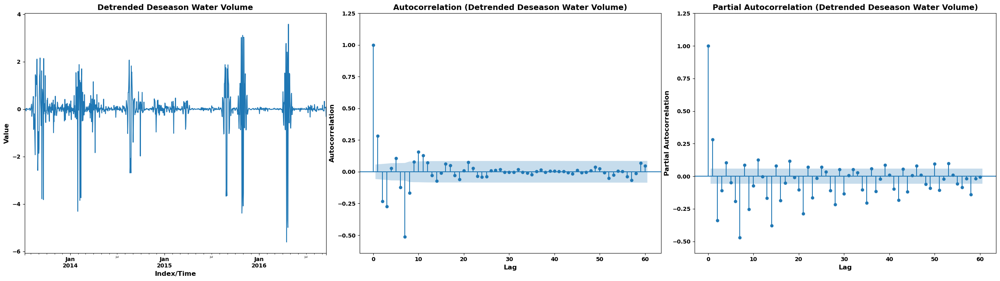

In [38]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_water.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Water Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_water.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_water.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

Looking at all the plots, there is an issue with the variance. I might stabalize the variance in another notebook. Also I am only going to use water lag 1

### 2.3 Cross Correlation plot
This part is important. As I am doing a direct forecast, so I can't use the actual lag values of the tagert

I am going to use this to plot  manually pick the lags. and force keep these lags in the lasso selector

In [39]:
df_ccf=df.copy()

In [40]:
stl_results = {}

for col in df_ccf:
    # Store the result in the dictionary using a dynamic key
    stl_results[f"res_{col}"] = STL(np.log1p(df_ccf[col])).fit()

#### CCF for oil

In [41]:
# target
res_oil = STL(np.log1p(df_ccf["BORE_OIL_VOL_STB_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D


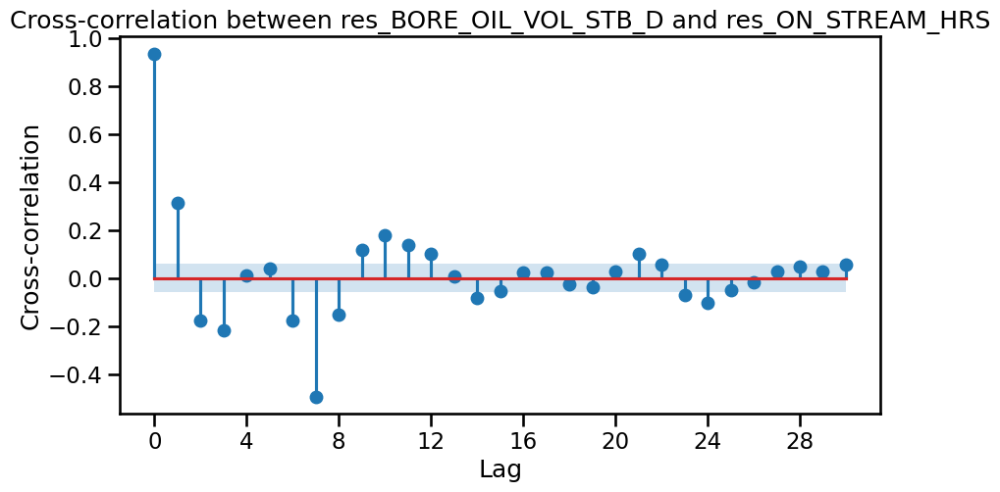

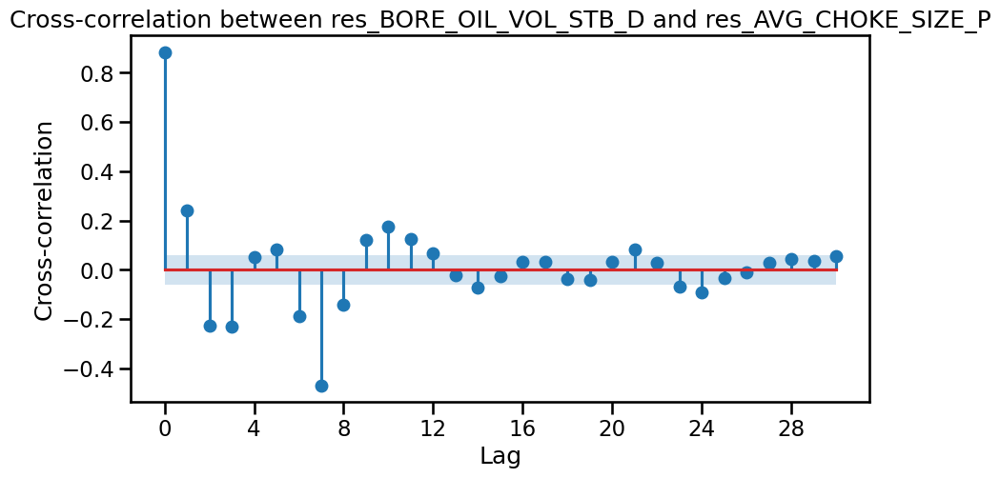

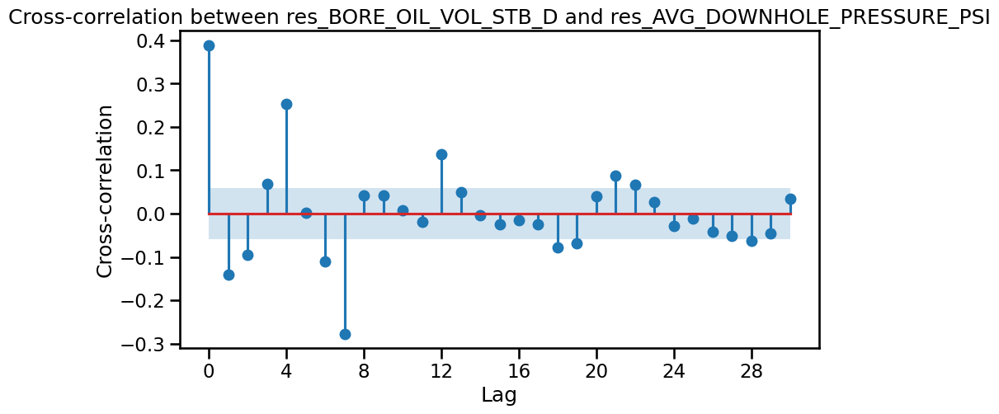

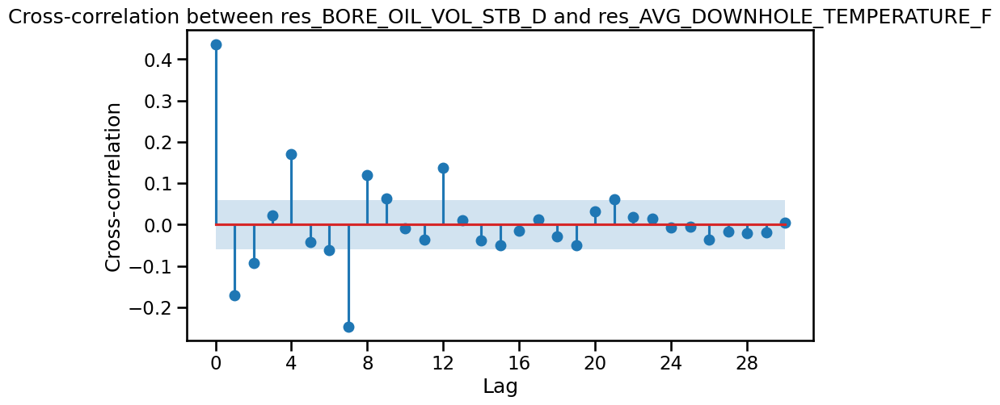

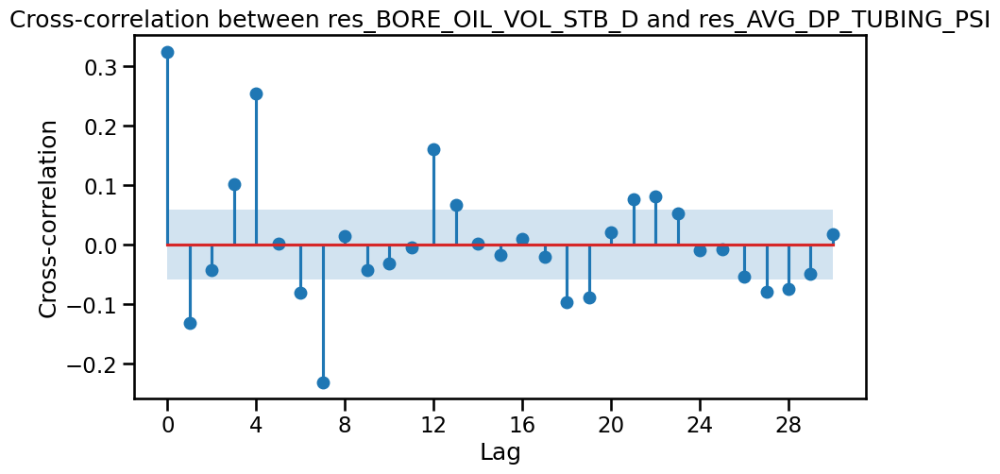

...

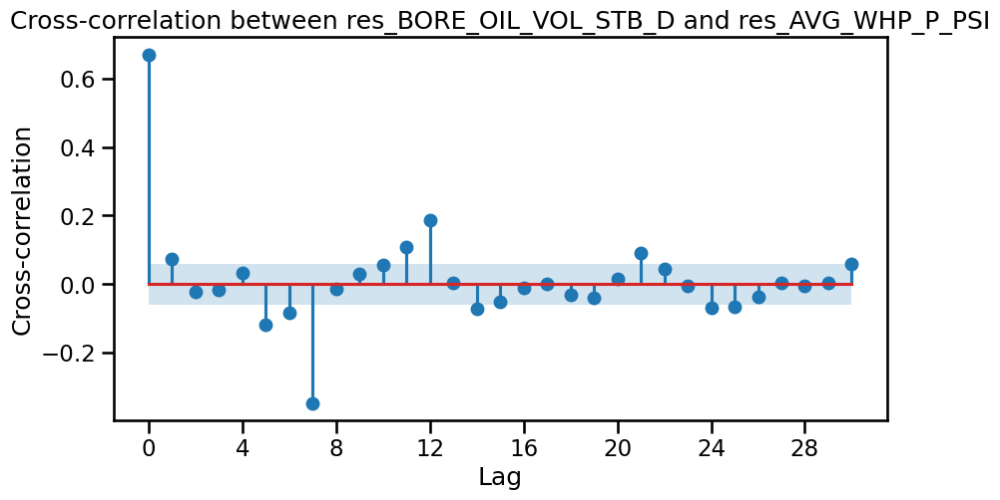

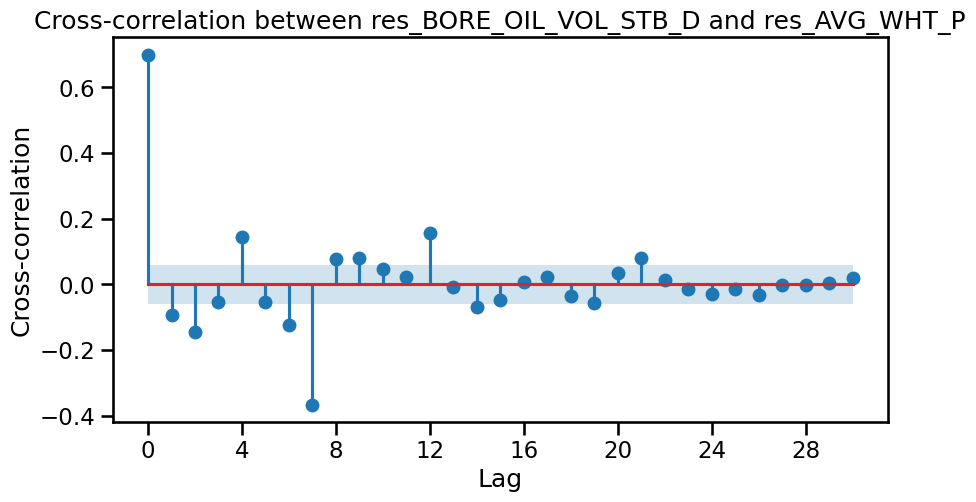

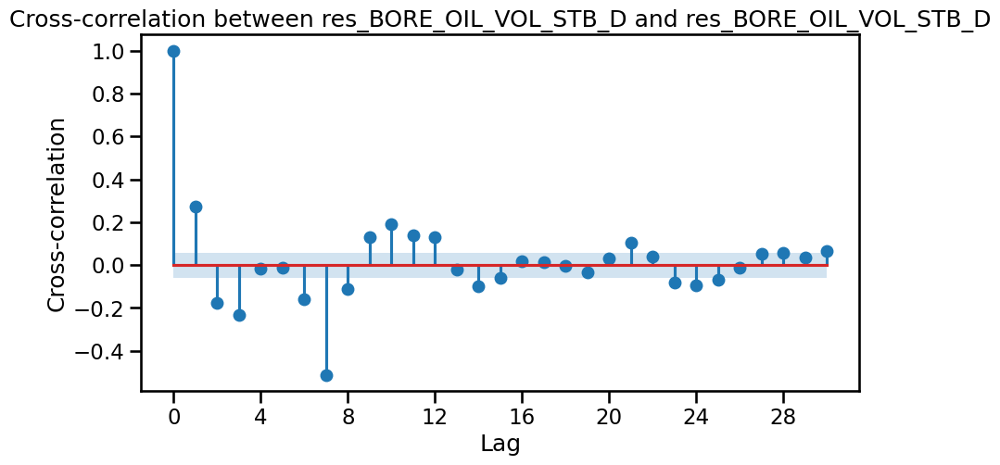

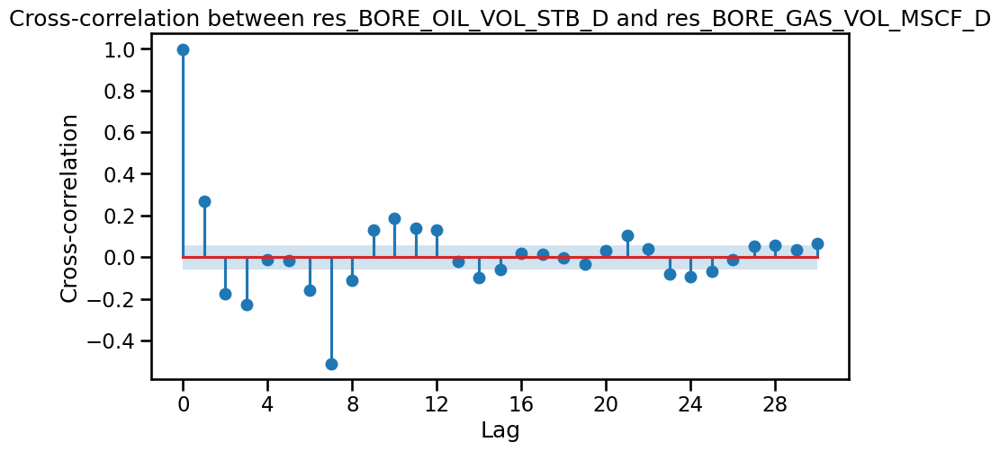

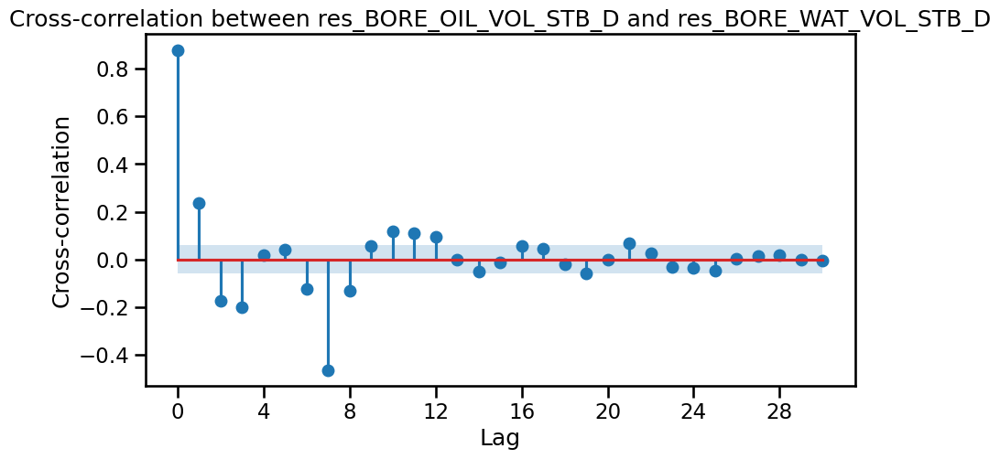

In [42]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_OIL_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_OIL_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
None

#### CCF for gas

In [43]:
# target
res_gas = STL(np.log1p(df_ccf["BORE_GAS_VOL_MSCF_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D


Analyzing components for: res_BORE_WAT_VOL_STB_D


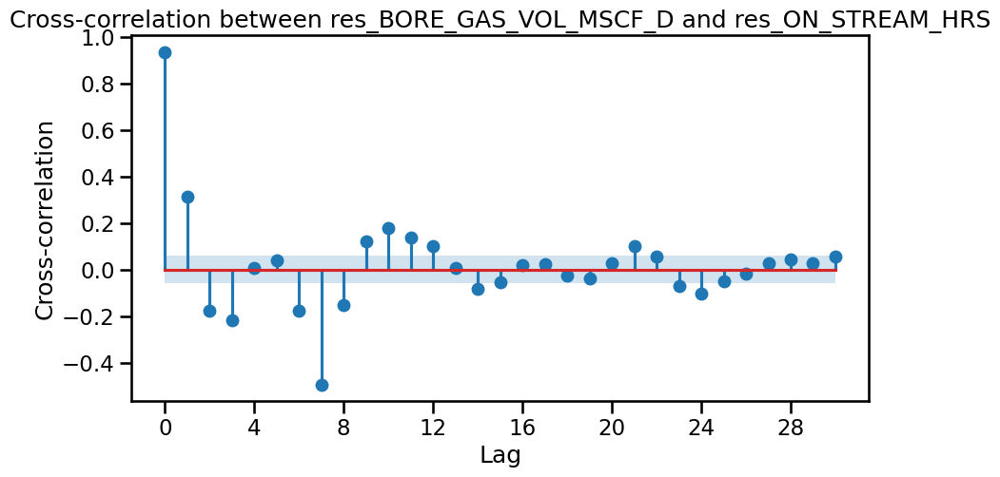

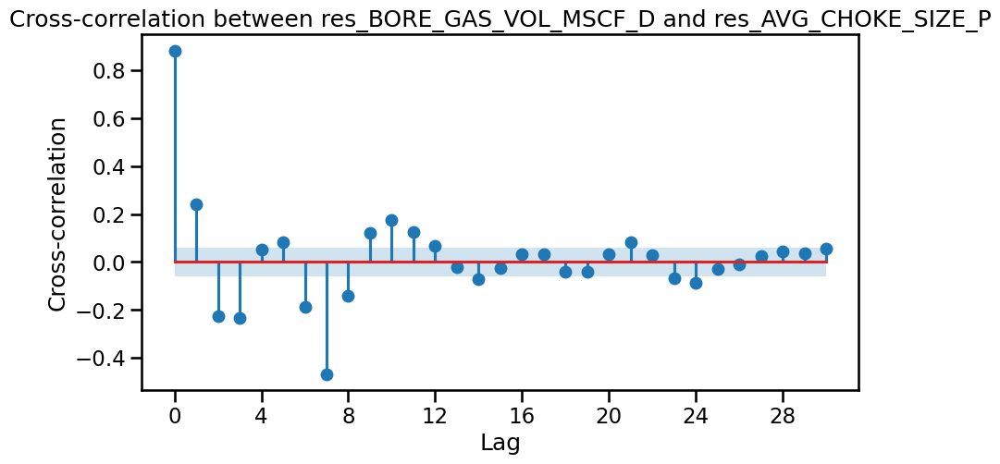

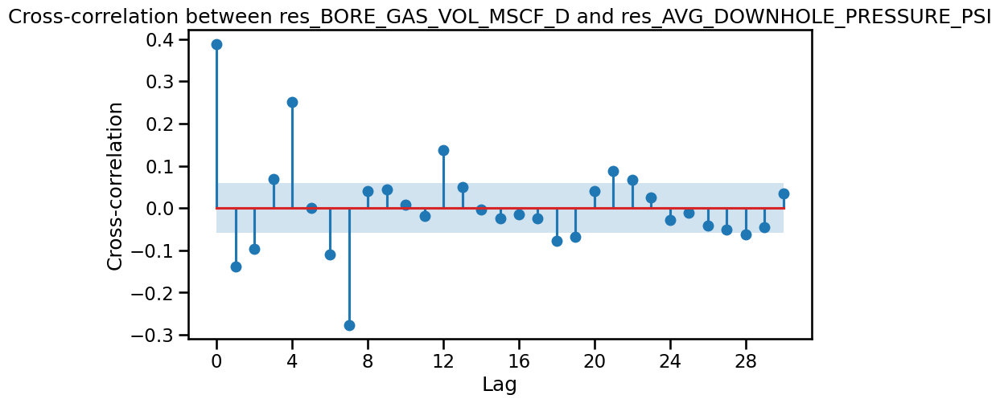

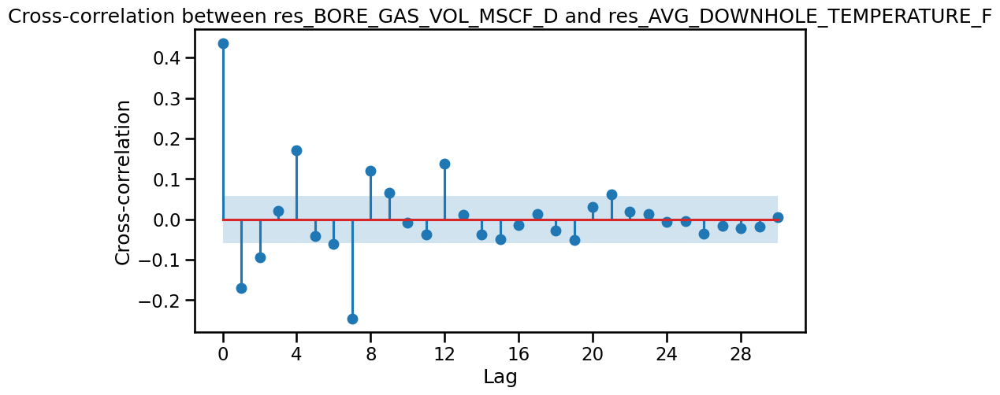

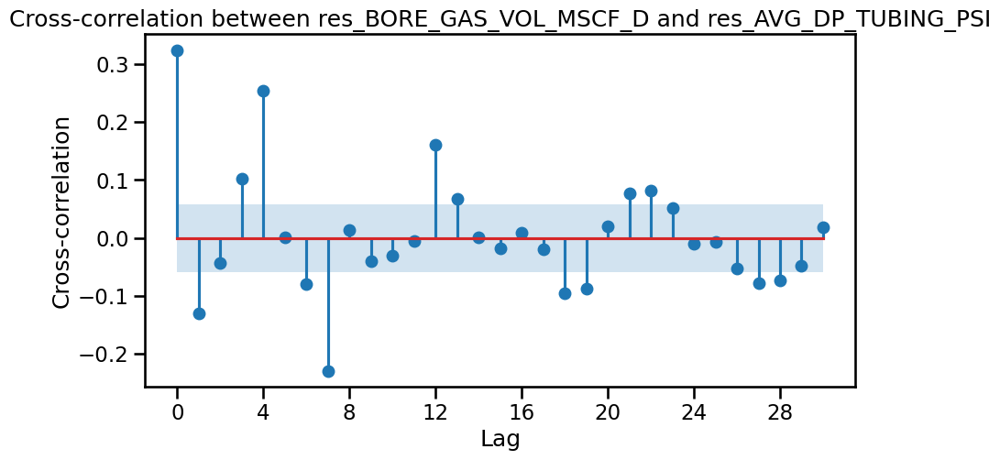

...

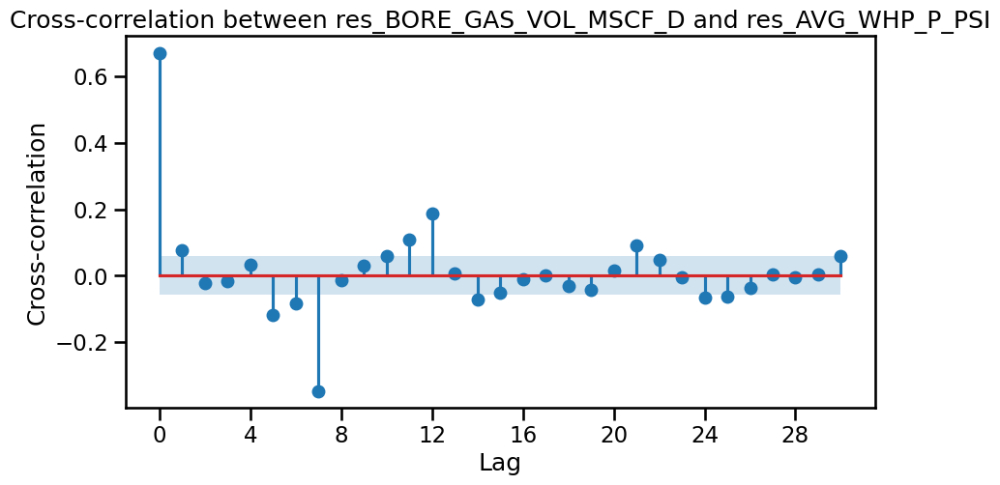

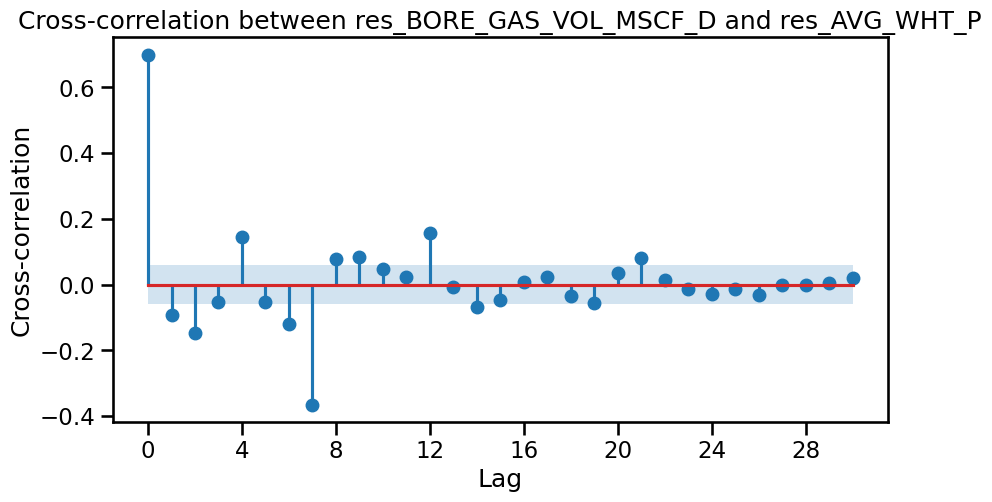

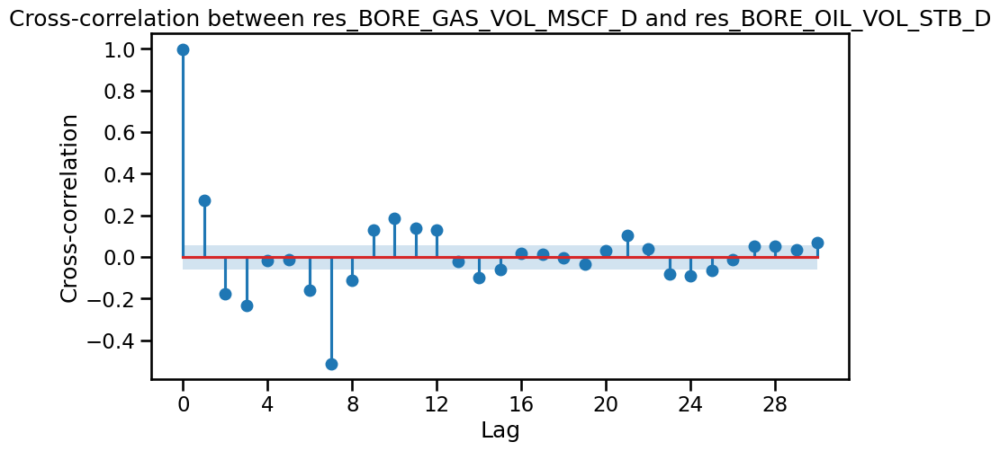

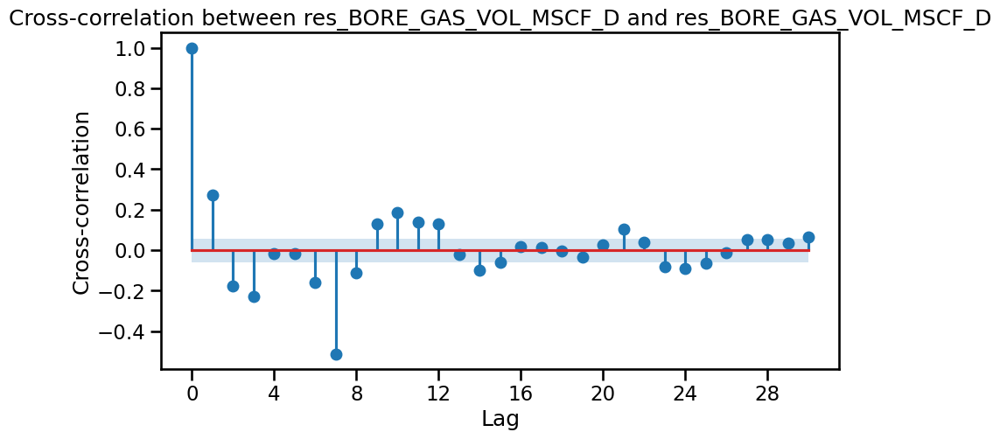

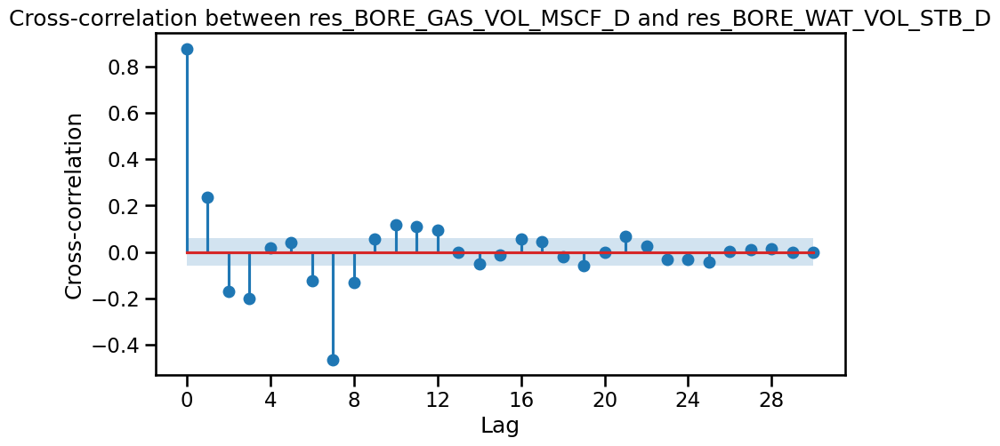

In [44]:
with sns.plotting_context("talk"):
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_GAS_VOL_MSCF_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_GAS_VOL_MSCF_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot 
avg annulus pressure[1]

#### CCF for water

In [45]:
# target
res_water = STL(np.log1p(df_ccf["BORE_WAT_VOL_STB_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D


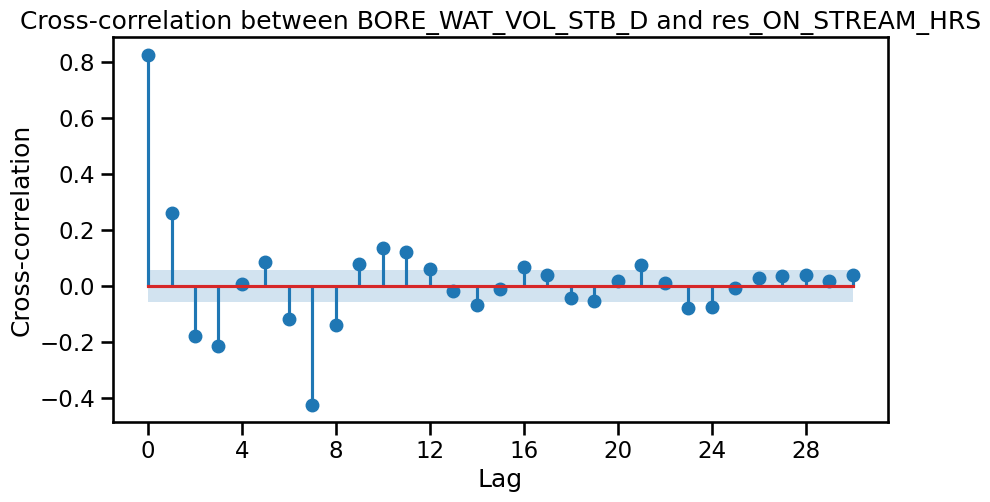

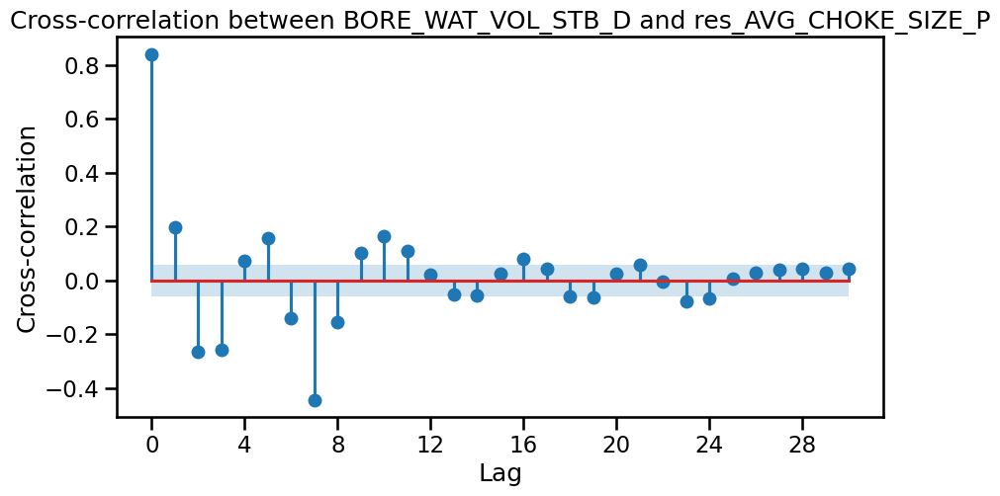

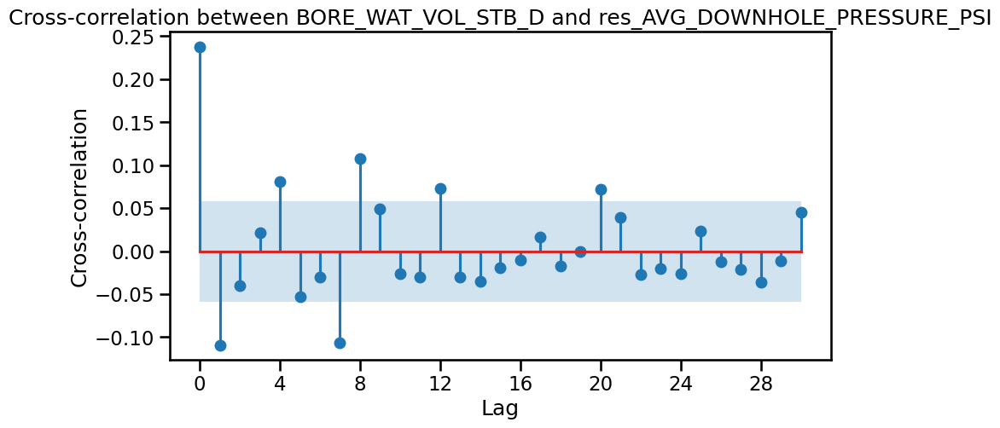

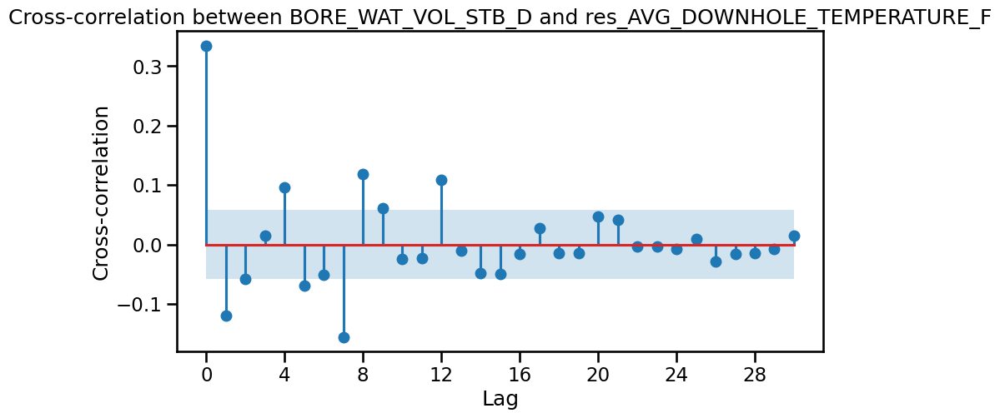

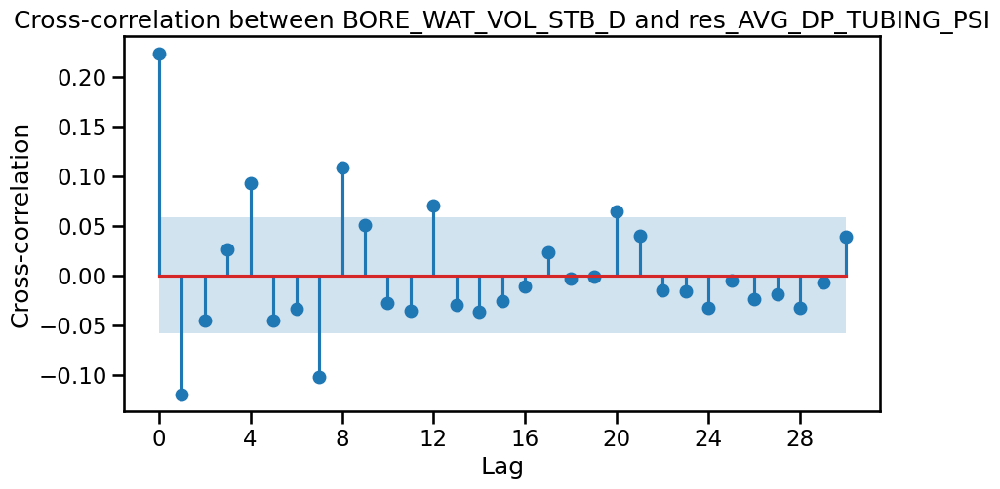

...

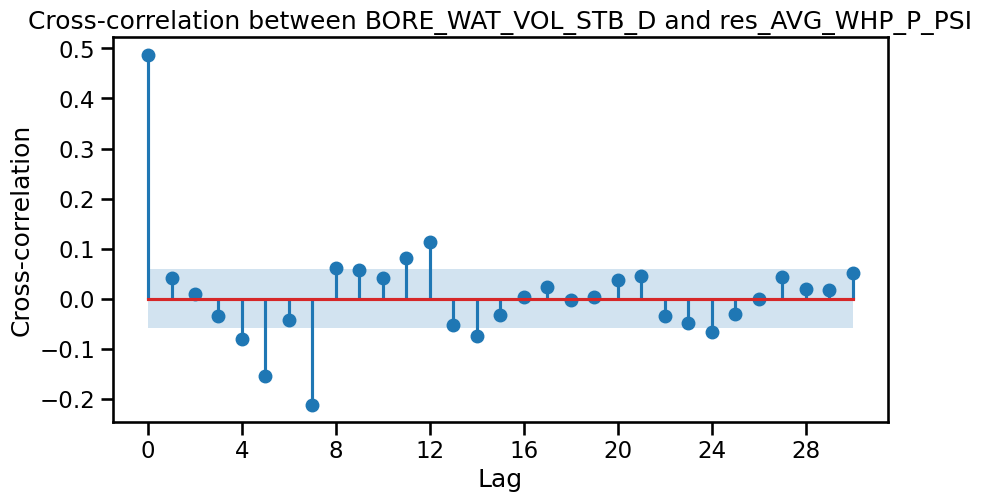

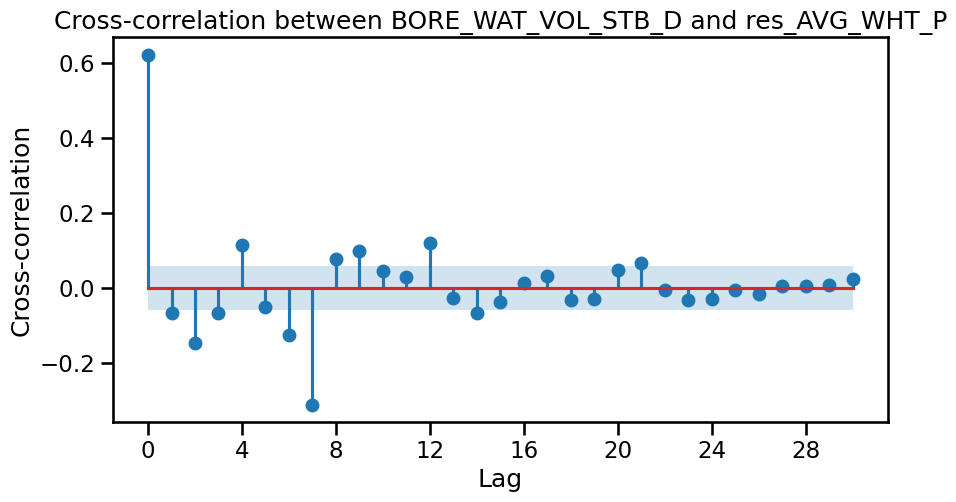

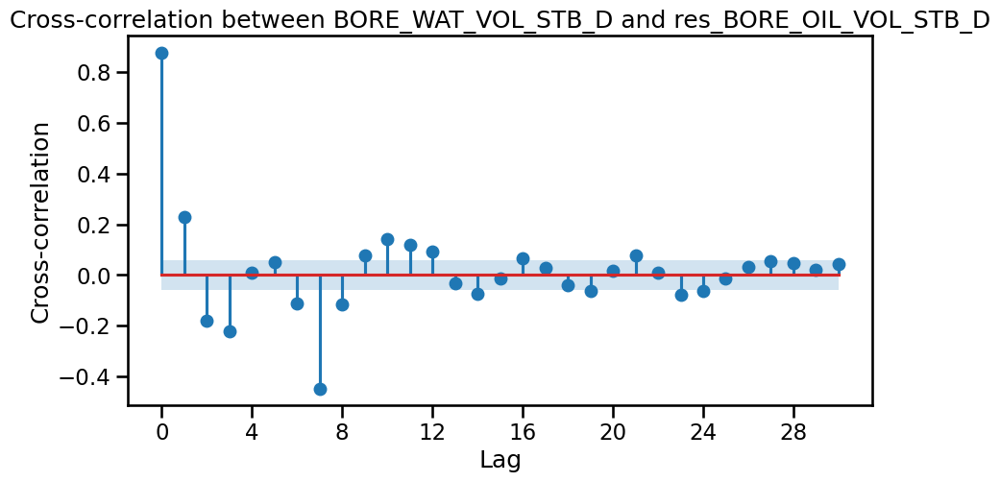

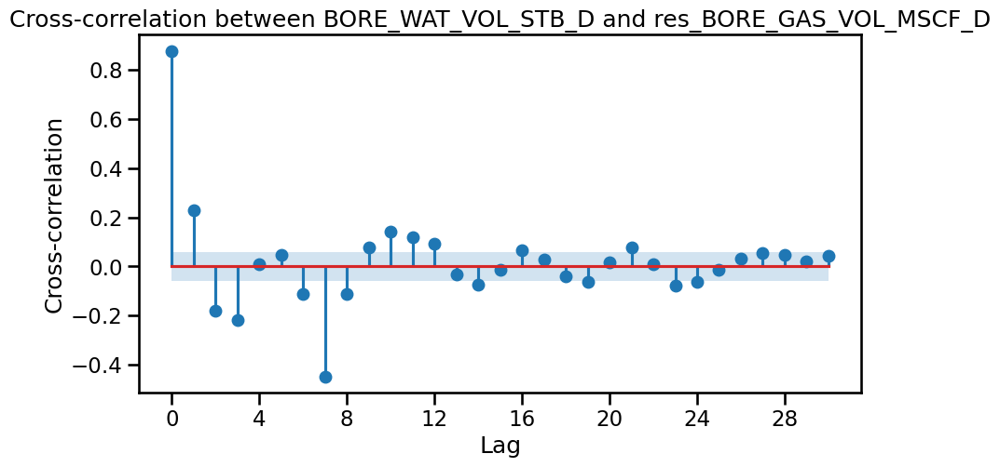

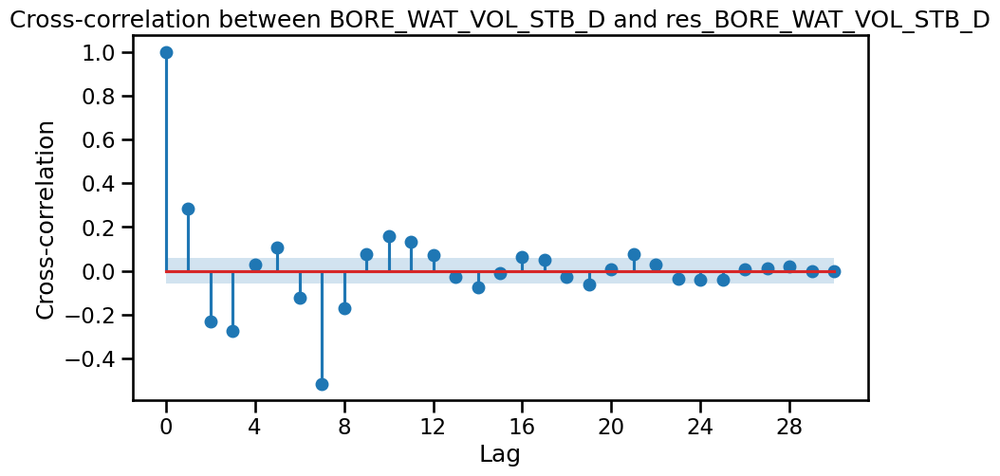

In [46]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_WAT_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between BORE_WAT_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
None


### 2.4 Exogenous Features

In [21]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [48]:
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


In [22]:
SENSOR_VARIABLES = [
    "ON_STREAM_HRS",
    "AVG_CHOKE_SIZE_P",
    "AVG_DOWNHOLE_PRESSURE_PSI",
    "AVG_DOWNHOLE_TEMPERATURE_F",
    "AVG_DP_TUBING_PSI",
    #"AVG_ANNULUS_PRESS_PSI",
    "DP_CHOKE_SIZE_PSI",
    "AVG_WHP_P_PSI",
    "AVG_WHT_P"
]
def make_sensor_lag_transformer():
    return LagFeatures(
        variables=SENSOR_VARIABLES,

        # Previous daily sensor measurements
        periods=[1, 2, 3, 7, 14, 30],

        sort_index=True,
        missing_values="ignore",
        drop_original=False,
        drop_na=False,
    )

In [23]:
oil_sensor_lag_feat = make_sensor_lag_transformer()
gas_sensor_lag_feat = make_sensor_lag_transformer()
water_sensor_lag_feat = make_sensor_lag_transformer()

In [24]:
oil_sensor_lag_feat.fit_transform(df)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,AVG_WHP_P_PSI_lag_14,AVG_WHT_P_lag_14,ON_STREAM_HRS_lag_30,AVG_CHOKE_SIZE_P_lag_30,AVG_DOWNHOLE_PRESSURE_PSI_lag_30,AVG_DOWNHOLE_TEMPERATURE_F_lag_30,AVG_DP_TUBING_PSI_lag_30,DP_CHOKE_SIZE_PSI_lag_30,AVG_WHP_P_PSI_lag_30,AVG_WHT_P_lag_30
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,...,157.819329,32.0,0.0,1.311110,0.0,32.0,157.659062,150.110704,157.659062,32.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,...,157.795688,32.0,0.0,1.105899,0.0,32.0,157.799023,149.474422,157.799023,32.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,...,157.839199,32.0,0.0,1.081938,0.0,32.0,157.732886,148.520943,157.732886,32.0


## 1 Calulate GOR and WCUT

In [52]:
GOR_WCUT_feat=GOR_WCUT_Transformer(
        oil_col='BORE_OIL_VOL_STB_D', 
        gas_col='BORE_GAS_VOL_MSCF_D', 
        water_col='BORE_WAT_VOL_STB_D')

In [53]:
# Add the GOR and WCUT to the dataframe.
df = GOR_WCUT_feat.fit_transform(df)

In [54]:
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


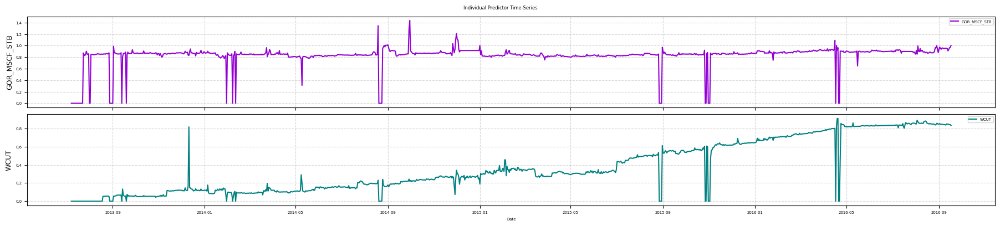

In [55]:
# plot the GOR and WCUT
seperate_predictor_plot(df[["GOR_MSCF_STB","WCUT"]])

In [56]:
df.isnull().sum()

ON_STREAM_HRS                 0
AVG_CHOKE_SIZE_P              0
AVG_DOWNHOLE_PRESSURE_PSI     0
AVG_DOWNHOLE_TEMPERATURE_F    0
AVG_DP_TUBING_PSI             0
AVG_ANNULUS_PRESS_PSI         0
DP_CHOKE_SIZE_PSI             0
AVG_WHP_P_PSI                 0
AVG_WHT_P                     0
BORE_OIL_VOL_STB_D            0
BORE_GAS_VOL_MSCF_D           0
BORE_WAT_VOL_STB_D            0
GOR_MSCF_STB                  0
WCUT                          0
dtype: int64

(df.select_dtypes(include='number') < 0).sum()

## 3. Window Feature

In [25]:
df_win=df.copy()
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,0.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,0.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,0.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,0.0


### 3.1 Rolling features for Exogenous Features

In [26]:
# rolling features

def make_sensor_window_transformer():
    return WindowFeatures(
        variables=SENSOR_VARIABLES,

        # Actual calendar-time windows
        window=["3D", "7D", "14D", "30D"],

        functions=["mean", "std", "min", "max"],

        # Shift the completed rolling statistics by one day
        # so today's window does not include today's sensor value.
        periods=1,
        freq="1D",

        sort_index=True,
        missing_values="ignore",
        drop_original=False,
        drop_na=False,
    )

In [27]:
oil_sensor_window_feat = make_sensor_window_transformer()
gas_sensor_window_feat = make_sensor_window_transformer()
water_sensor_window_feat = make_sensor_window_transformer()

In [28]:
df_win=oil_sensor_lag_feat.fit_transform(df_win)
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,AVG_WHP_P_PSI_lag_14,AVG_WHT_P_lag_14,ON_STREAM_HRS_lag_30,AVG_CHOKE_SIZE_P_lag_30,AVG_DOWNHOLE_PRESSURE_PSI_lag_30,AVG_DOWNHOLE_TEMPERATURE_F_lag_30,AVG_DP_TUBING_PSI_lag_30,DP_CHOKE_SIZE_PSI_lag_30,AVG_WHP_P_PSI_lag_30,AVG_WHT_P_lag_30
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,...,157.819329,32.0,0.0,1.311110,0.0,32.0,157.659062,150.110704,157.659062,32.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,...,157.795688,32.0,0.0,1.105899,0.0,32.0,157.799023,149.474422,157.799023,32.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,...,157.839199,32.0,0.0,1.081938,0.0,32.0,157.732886,148.520943,157.732886,32.0


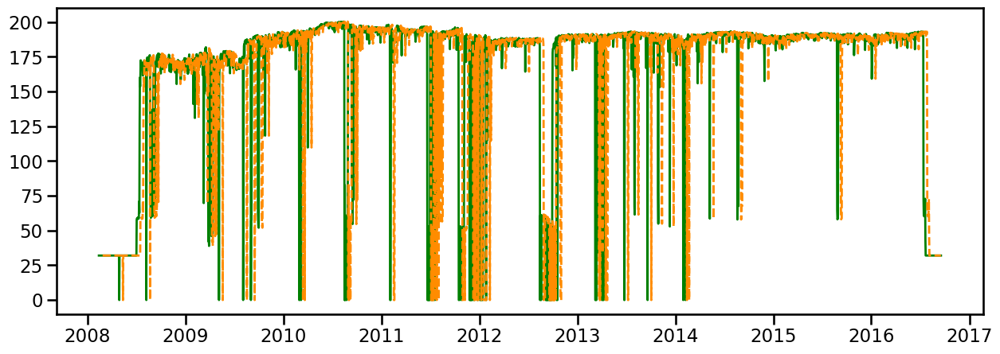

In [29]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["AVG_WHT_P"], label="AVG_WHT_P", color="green", linewidth=2)
    plt.plot(df_win.index,df_win["AVG_WHT_P_lag_14"],label="AVG_WHT_P_lag_14",color="darkorange",linewidth=2,linestyle="--",)

### 3.2 Expanding features

In [30]:
# expanding window

def make_onstream_cumulative_transformer():
    return ExpandingWindowFeatures(
        variables=["ON_STREAM_HRS"],
        functions=["sum"],
        periods=1,
        freq="1D",
        missing_values="ignore",
        drop_original=False,
        drop_na=False,
    )

oil_onstream_cumulative_feat = (make_onstream_cumulative_transformer())
gas_onstream_cumulative_feat = (make_onstream_cumulative_transformer())
water_onstream_cumulative_feat = (make_onstream_cumulative_transformer())

In [31]:
oil_onstream_cumulative_feat.fit_transform(df_win)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,AVG_WHT_P_lag_14,ON_STREAM_HRS_lag_30,AVG_CHOKE_SIZE_P_lag_30,AVG_DOWNHOLE_PRESSURE_PSI_lag_30,AVG_DOWNHOLE_TEMPERATURE_F_lag_30,AVG_DP_TUBING_PSI_lag_30,DP_CHOKE_SIZE_PSI_lag_30,AVG_WHP_P_PSI_lag_30,AVG_WHT_P_lag_30,ON_STREAM_HRS_expanding_sum
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,...,32.0,0.0,1.311110,0.0,32.0,157.659062,150.110704,157.659062,32.0,62773.67519
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,...,32.0,0.0,1.105899,0.0,32.0,157.799023,149.474422,157.799023,32.0,62773.67519
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,...,32.0,0.0,1.081938,0.0,32.0,157.732886,148.520943,157.732886,32.0,62773.67519


### 3.3 Rolling Slope

In [32]:
Rolling_Slope_SENSOR_VARIABLES = [
    "ON_STREAM_HRS",
    "AVG_CHOKE_SIZE_P",
    "AVG_DOWNHOLE_PRESSURE_PSI",
    "AVG_DOWNHOLE_TEMPERATURE_F",
    "AVG_DP_TUBING_PSI",
    #"AVG_ANNULUS_PRESS_PSI",
    "DP_CHOKE_SIZE_PSI",
    "AVG_WHP_P_PSI",
    "AVG_WHT_P"
]



def make_sensor_slope_transformer():
    return RollingSlopeFeatures(
        variables=Rolling_Slope_SENSOR_VARIABLES,

        # Short-, medium-, and longer-term trends
        windows=(7, 14, 30),

        # The transformer can determine the default
        # minimum observations from each window.
        min_periods=None,

        # Shift by one day so that the slope for day t
        # uses sensor observations only through day t-1.
        periods=1,

        drop_original=False,
        sort_index=True,
    )

In [33]:
oil_sensor_slope_feat = make_sensor_slope_transformer()

gas_sensor_slope_feat = make_sensor_slope_transformer()

water_sensor_slope_feat = make_sensor_slope_transformer()

In [34]:
df_win=oil_sensor_slope_feat.fit_transform(df_win)
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,AVG_DP_TUBING_PSI_slope_30D,DP_CHOKE_SIZE_PSI_slope_7D,DP_CHOKE_SIZE_PSI_slope_14D,DP_CHOKE_SIZE_PSI_slope_30D,AVG_WHP_P_PSI_slope_7D,AVG_WHP_P_PSI_slope_14D,AVG_WHP_P_PSI_slope_30D,AVG_WHT_P_slope_7D,AVG_WHT_P_slope_14D,AVG_WHT_P_slope_30D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,...,0.000960,-0.269387,-0.415058,-0.788398,0.000813,-0.004392,0.000960,1.563853e-15,-1.441588e-15,-5.208933e-16
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,...,-0.000424,-0.268724,-0.377196,-0.765126,-0.001652,-0.006422,-0.000424,1.563853e-15,-1.441588e-15,-5.208933e-16
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,...,-0.000522,-0.257220,-0.332541,-0.737477,-0.006330,-0.007219,-0.000522,1.563853e-15,-1.441588e-15,-5.208933e-16


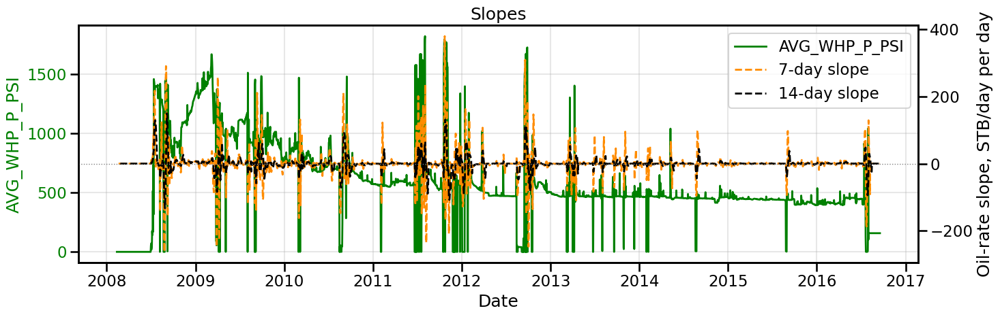

In [35]:

with sns.plotting_context("talk"):

    fig, ax1 = plt.subplots(figsize=(15, 5))

    # Primary y-axis: oil rate
    line1 = ax1.plot(
        df_win.index,
        df_win["AVG_WHP_P_PSI"],
        label="AVG_WHP_P_PSI",
        color="green",
        linewidth=2,
    )

    ax1.set_xlabel("Date")
    ax1.set_ylabel("AVG_WHP_P_PSI", color="green")
    ax1.tick_params(axis="y", labelcolor="green")
    ax1.grid(alpha=0.3)

    # Secondary y-axis: both slope features
    ax2 = ax1.twinx()

    line2 = ax2.plot(df_win.index,df_win["AVG_WHP_P_PSI_slope_7D"],label="7-day slope",color="darkorange",linewidth=2,linestyle="--",)

    line3 = ax2.plot(df_win.index,df_win["AVG_WHP_P_PSI_slope_14D"],label="14-day slope",color="black",linewidth=2,linestyle="--",)

    ax2.set_ylabel("Oil-rate slope, STB/day per day")
    ax2.axhline(y=0,color="gray",linewidth=1,linestyle=":",)

    # Combined legend from both axes
    lines = line1 + line2 + line3
    labels = [line.get_label() for line in lines]

    ax1.legend(lines,labels,loc="best",)

    plt.title("Slopes")
    fig.tight_layout()
    plt.show()

## 4. Trend feature

### 4.Time feature t & t^2

In [36]:


def make_Time_features_transformer():
    return TrendFeatureAdder(
    freq="D",
    degree=2,
    include_bias=False,
    prefix="time_since",
    overwrite=True,
    verbose=True,
)

In [37]:
oil_trend_feat = make_Time_features_transformer()
gas_trend_feat = make_Time_features_transformer()
water_trend_feat = make_Time_features_transformer()

In [38]:
oil_trend_feat.fit_transform(df)

Trend features added: ['time_since_D', 'time_since_D_power_2']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,time_since_D,time_since_D_power_2
DATEPRD,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0,1.0,1.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0,2.0,4.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,0.0,3.0,9.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,0.0,4.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,0.0,3136.0,9834496.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,0.0,3137.0,9840769.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,0.0,3138.0,9847044.0


## 5. Seasonality

There are 3 main main to model seasonality. I will take monthly seasonality as an example
1. Integer to represent the month [1,2,3...] This is good for tree based model, but not for linear models
2. Dummies to represent the month. This is good for linear models but not for tree based models because it is sparse.
3. Fourier series. good for linear models and give u less features.
4. Can just only use sine or consine transformation

In [39]:
df_season=df.copy()
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,0.0
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,0.0
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,0.0
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,0.0


### 5.2 datetime from feature engine
This is just Interger for the week & Month

In [40]:
# Interger for datetime

In [41]:
week_month_of_year_adder = DatetimeFeatures(
    variables="index",
    features_to_extract=["week", "month"],
    drop_original=False
)

In [42]:
df_season = week_month_of_year_adder.fit_transform(df_season)

### 5.3 Sine and Cosine transformation
Use feature engine to do sine and cosine transformation

In [43]:
sin_cos_adder=CyclicalFeatures(
    variables=["week", "month"],
    drop_original=False
)

In [44]:
df_season=sin_cos_adder.fit_transform(df_season)
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,week,month,week_sin,week_cos,month_sin,month_cos
DATEPRD,,,,,,,,,,,,,,,,,
2008-02-12,0.0,0.000000,0.0,32.0,0.000000,0.853549,0.000000,32.0,0.0,0.0,0.0,7,2,0.737833,0.674983,0.866025,5.000000e-01
2008-02-13,0.0,0.000000,0.0,32.0,0.000000,0.981617,0.000000,32.0,0.0,0.0,0.0,7,2,0.737833,0.674983,0.866025,5.000000e-01
2008-02-14,0.0,0.000000,0.0,32.0,0.000000,0.717938,0.000000,32.0,0.0,0.0,0.0,7,2,0.737833,0.674983,0.866025,5.000000e-01
2008-02-15,0.0,0.000000,0.0,32.0,0.000000,0.963052,0.000000,32.0,0.0,0.0,0.0,7,2,0.737833,0.674983,0.866025,5.000000e-01
2008-02-16,0.0,0.000000,0.0,32.0,0.000000,1.519853,0.000000,32.0,0.0,0.0,0.0,7,2,0.737833,0.674983,0.866025,5.000000e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,0.0,0.949366,0.0,32.0,157.704894,129.002164,157.704894,32.0,0.0,0.0,0.0,37,9,-0.947326,-0.320270,-1.000000,-1.836970e-16
2016-09-14,0.0,1.114524,0.0,32.0,157.757688,128.904988,157.757688,32.0,0.0,0.0,0.0,37,9,-0.947326,-0.320270,-1.000000,-1.836970e-16
2016-09-15,0.0,1.000474,0.0,32.0,157.841520,128.446523,157.841520,32.0,0.0,0.0,0.0,37,9,-0.947326,-0.320270,-1.000000,-1.836970e-16


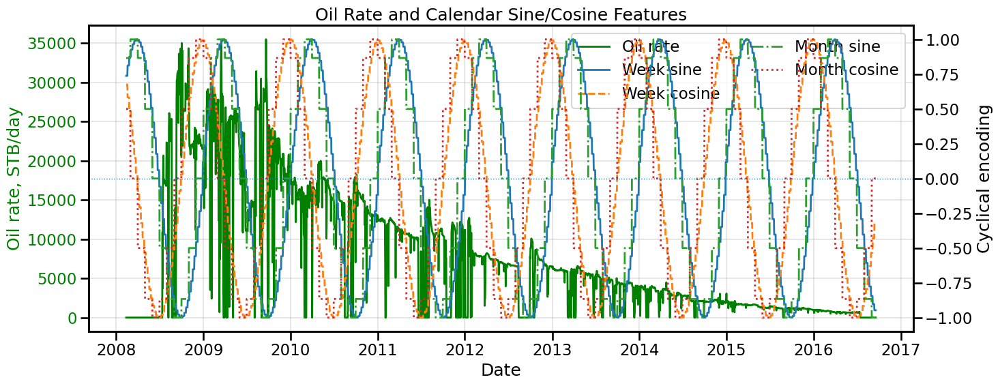

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

with sns.plotting_context("talk"):

    fig, ax1 = plt.subplots(figsize=(15, 6))

    # Left axis: oil rate
    oil_line = ax1.plot(
        df_season.index,
        df_season["BORE_OIL_VOL_STB_D"],
        label="Oil rate",
        color="green",
        linewidth=2,
    )

    ax1.set_xlabel("Date")
    ax1.set_ylabel("Oil rate, STB/day", color="green")
    ax1.tick_params(axis="y", labelcolor="green")
    ax1.grid(alpha=0.3)

    # Right axis: cyclical features
    ax2 = ax1.twinx()

    week_sin_line = ax2.plot(df_season.index,df_season["week_sin"],label="Week sine",linewidth=2,)

    week_cos_line = ax2.plot(df_season.index,df_season["week_cos"],label="Week cosine", linewidth=2,linestyle="--",)

    month_sin_line = ax2.plot(df_season.index,df_season["month_sin"],label="Month sine",linewidth=2,linestyle="-.",)

    month_cos_line = ax2.plot(df_season.index,df_season["month_cos"],label="Month cosine",linewidth=2,linestyle=":",)

    ax2.set_ylabel("Cyclical encoding")
    ax2.set_ylim(-1.1, 1.1)
    ax2.axhline(0, linewidth=1, linestyle=":")

    # Combined legend
    lines = (oil_line+ week_sin_line+ week_cos_line+ month_sin_line+ month_cos_line)

    labels = [line.get_label() for line in lines]

    ax1.legend(
        lines,
        labels,
        loc="upper right",
        ncol=2,
    )

    plt.title("Oil Rate and Calendar Sine/Cosine Features")
    fig.tight_layout()
    plt.show()

## 6. Create Final lags columns that I am interested in shifted by 1 day

In [52]:
df_create_1_day=df.copy()

In [53]:
#Based on my domain knowlege these are variables I know that will be strong predictors. So I want these variables to be there, to prevent data leakage, I have shifted by 1 day

#specific_lag1_adder = AddSpecificLag1Features(
    #variables=['ON_STREAM_HRS', "AVG_CHOKE_SIZE_P", 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
    #variables=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       #'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       #'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       #'AVG_WHT_P'],
    
    #freq="1D",
    #verbose=True,
#)

In [54]:
#df_create_1_day=specific_lag1_adder.fit_transform(df_create_1_day)
#(df_create_1_day.columns, len(df_create_1_day.columns))

In [55]:
df_create_1_day_use=df_create_1_day.copy()

## 7.Drop Features

I am going to use this to drop columns that will result in data leakage. I am not too sure about ON_STREAM_HRS for now, but I will remove it for now. For each phase, I will have to keep the target because I need the target when I make the feature engineering

In [56]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [57]:
df_create_1_day_use=df_create_1_day.copy()

In [84]:
#phase_column_dropper = DropFeatures(
    #features_to_drop=[
        #"GOR_MSCF_STB",
        #"WCUT",
  #]
#)

In [85]:
#df_create_1_day_use=phase_column_dropper.fit_transform(df_create_1_day_use)
#(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

# SPLIT DATA

In [58]:
from sarima_helper_functions import sarima_split_train_test_keep

train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df, 0.6,0.15,0.15)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_date=keep_data.index[0]
len(df)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

max_lookback = 30 # largest lag / rolling / expanding history needed
#val
shifted_start_val = pd.Timestamp(start_of_val_date) - pd.offsets.Day(max_lookback)
X_val_shift = df[(df.index >= shifted_start_val) & (df.index < start_of_test_date)]
#test
shifted_start_test = pd.Timestamp(start_of_test_date) - pd.offsets.Day(max_lookback)
X_test_shift = df[(df.index >= shifted_start_test) & (df.index < start_of_keep_date)]
#keep
shifted_start_keep = pd.Timestamp(start_of_keep_date) - pd.offsets.Day(max_lookback)
X_keep_shift = df[(df.index >= shifted_start_keep) ]

#display(train_data, X_val_shift, X_test_shift,X_keep_shift)

In [59]:
train_data.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
      dtype='object')

# FEATURE SET (used by Model 1)

In [60]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [61]:
SENSOR_VARIABLES = [
    'ON_STREAM_HRS', 
    'AVG_CHOKE_SIZE_P', 
    'AVG_DOWNHOLE_PRESSURE_PSI',
    'AVG_DOWNHOLE_TEMPERATURE_F', 
    'AVG_DP_TUBING_PSI',
    #'AVG_ANNULUS_PRESS_PSI', 
    'DP_CHOKE_SIZE_PSI', 
   'AVG_WHP_P_PSI',
    'AVG_WHT_P',
]

FUTURE_KNOWN_VARIABLES = []

# MODEL 1: Direct Walk-Forward (periodic reset, no recursion)

Trains one independent Lasso model per (phase, horizon) pair -- horizon 1 through 30 -- then deploys that library as a walk-forward simulation instead of scoring every possible anchor independently.

At each reset date, every day out to `block_horizon` is predicted directly from that one real anchor -- day+1 from the horizon=1 model, day+2 from the horizon=2 model, ..., day+block_horizon from the horizon=block_horizon model. Each day's feature row is just the anchor's real row, reused across all H models -- no day's prediction ever depends on another day's prediction. Only the anchor itself resets, every block_horizon days, to the next real measurement.

A 7-day deployment uses the horizon 1-7 subset of the library; a 30-day deployment uses the full 1-30 set. Both are run below, on train and validation data.

In [62]:
from Direct_Horizon_Model0_helper_functions import run_model0_horizon_sweep
from Direct_Horizon_Model1_helper_functions import run_model1_direct_walk_forward

model1_horizons = tuple(range(1, 31))

model1_horizon_results, _model1_horizon_metrics_df = run_model0_horizon_sweep(
    df=df,
    train_data=train_data,
    val_data=val_data,
    horizons=model1_horizons,
    sensor_variables=SENSOR_VARIABLES,
    future_known_variables=FUTURE_KNOWN_VARIABLES,
    n_splits=10,
    verbose=False,
)

models_by_horizon = {h: model1_horizon_results[h]["models"] for h in model1_horizons}

model1_block_horizons = (1, 7, 14, 30)
model1_train_daily_results = {}
model1_val_daily_results = {}

for block_horizon in model1_block_horizons:
    train_daily_df, _train_eob_df = run_model1_direct_walk_forward(
        models_by_horizon=models_by_horizon,
        df=df,
        simulation_data=train_data,
        block_horizon=block_horizon,
        sensor_variables=SENSOR_VARIABLES,
        future_known_variables=FUTURE_KNOWN_VARIABLES,
        verbose=False,
    )
    val_daily_df, _val_eob_df = run_model1_direct_walk_forward(
        models_by_horizon=models_by_horizon,
        df=df,
        simulation_data=val_data,
        block_horizon=block_horizon,
        sensor_variables=SENSOR_VARIABLES,
        future_known_variables=FUTURE_KNOWN_VARIABLES,
        verbose=False,
    )

    model1_train_daily_results[block_horizon] = train_daily_df
    model1_val_daily_results[block_horizon] = val_daily_df

## Diagnostics per block length

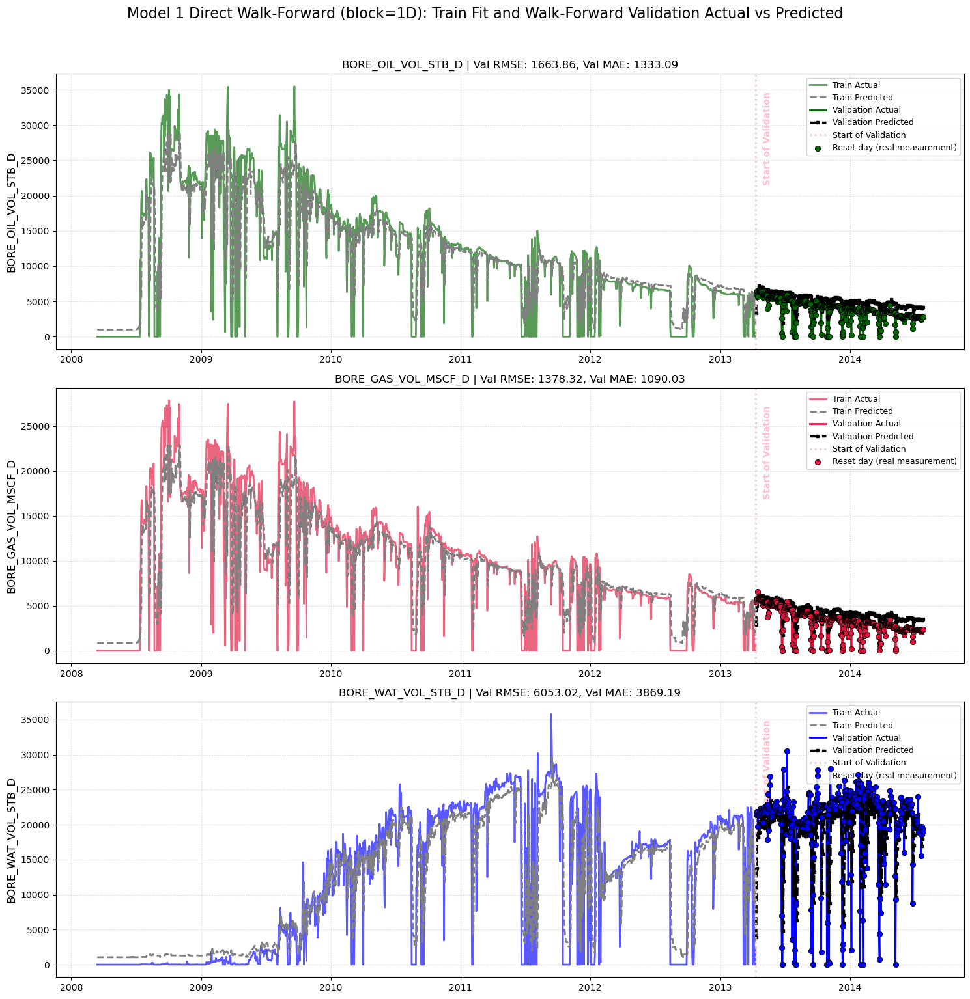

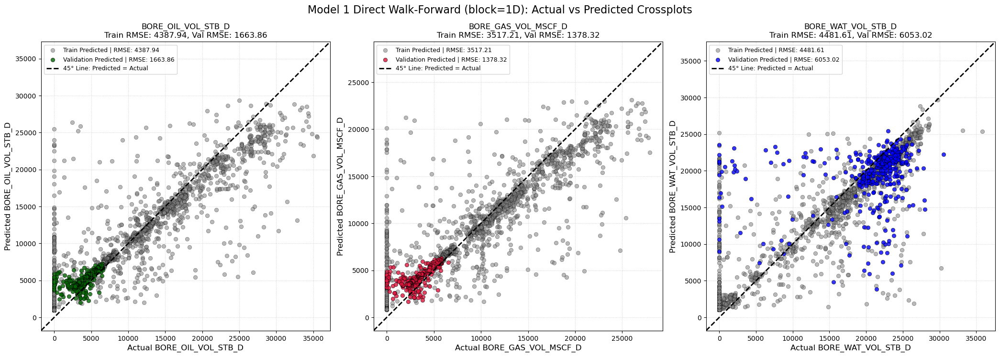

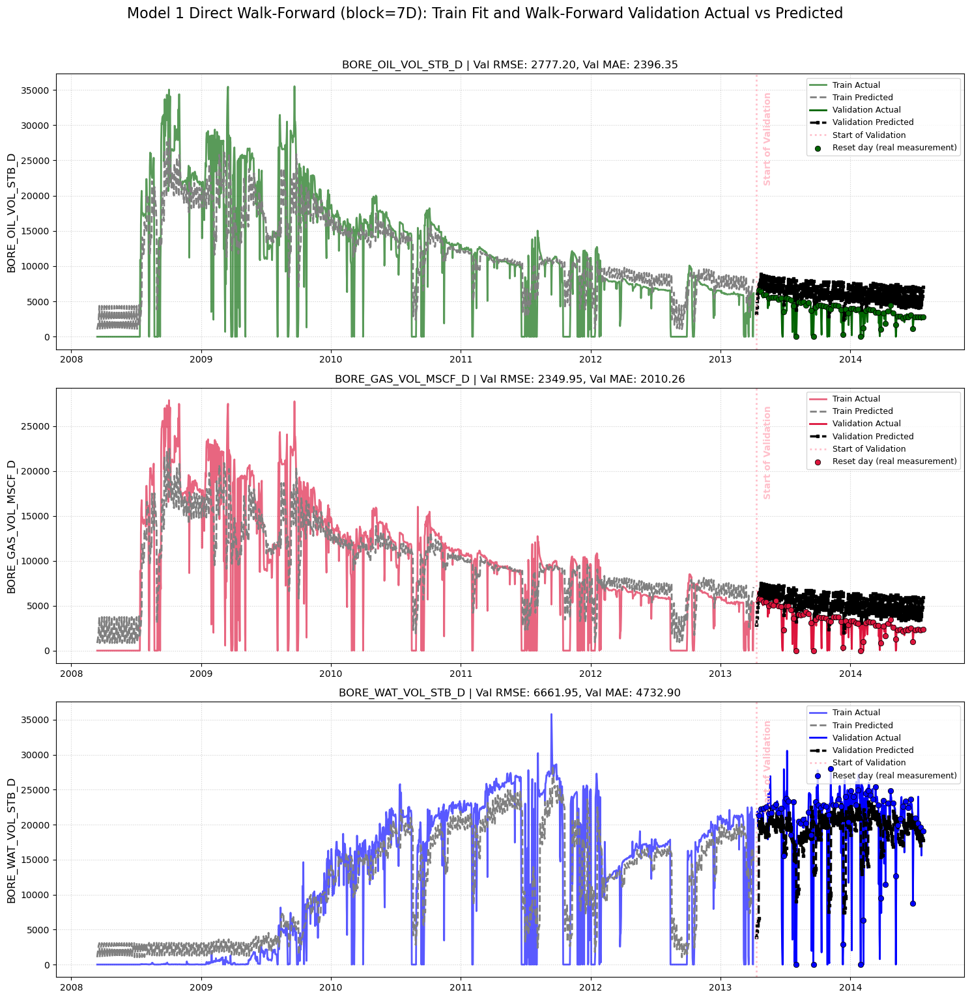

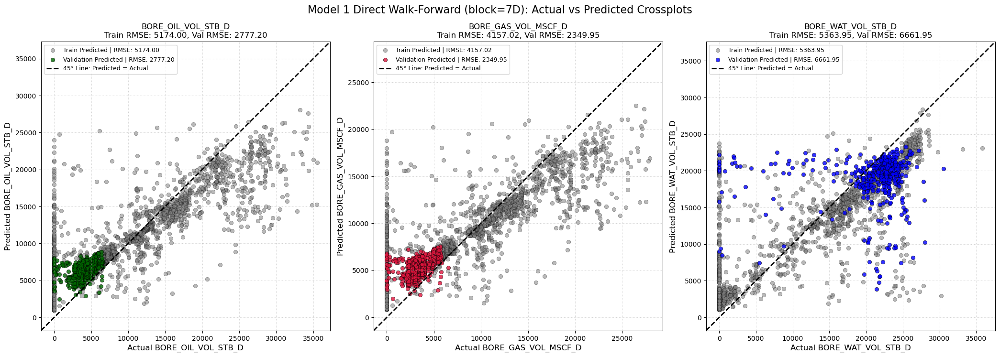

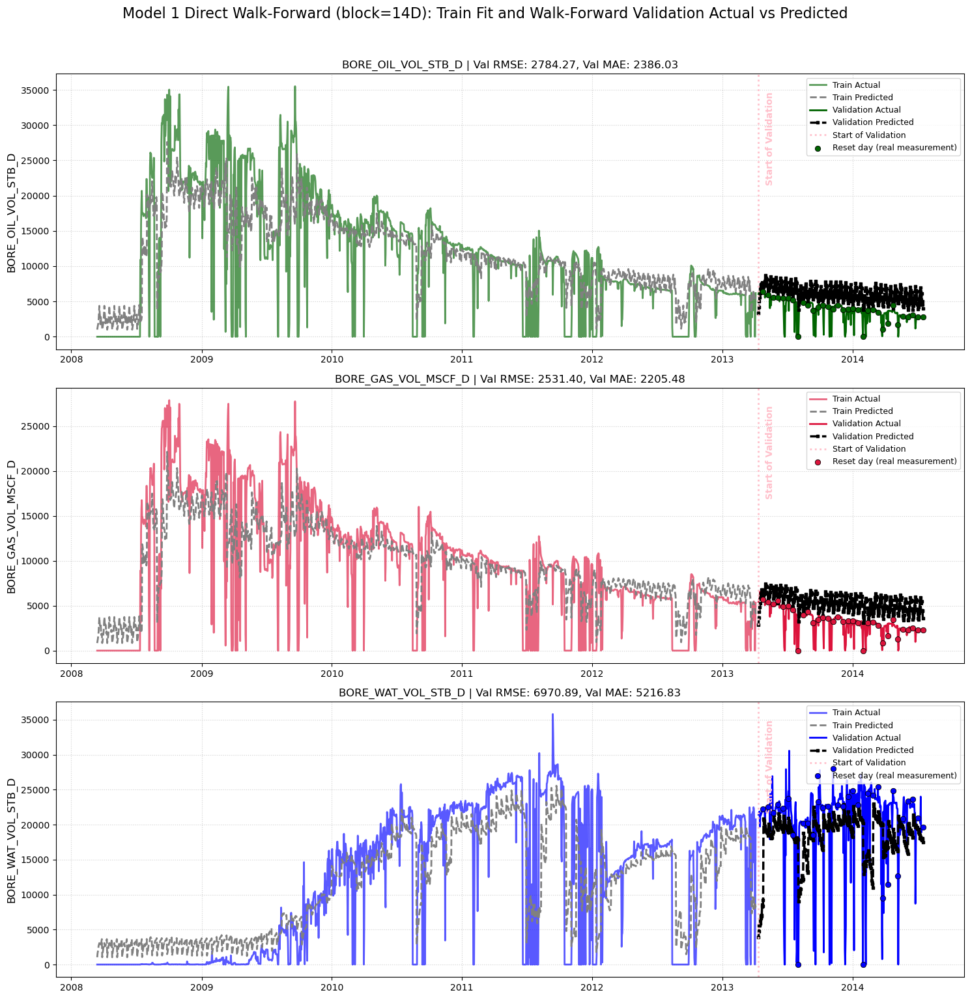

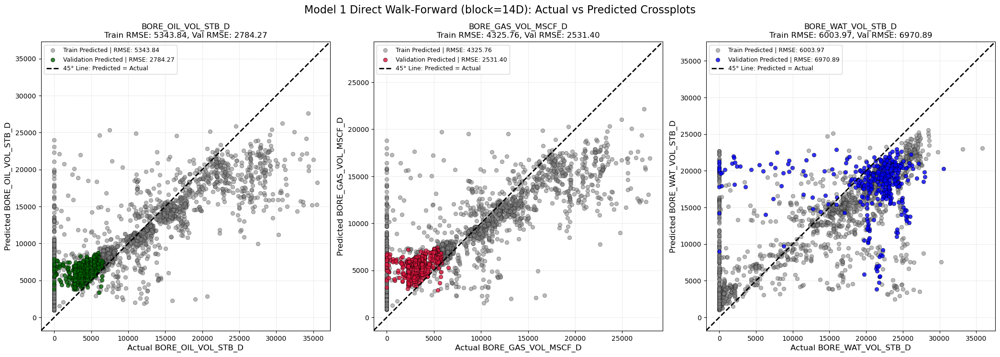

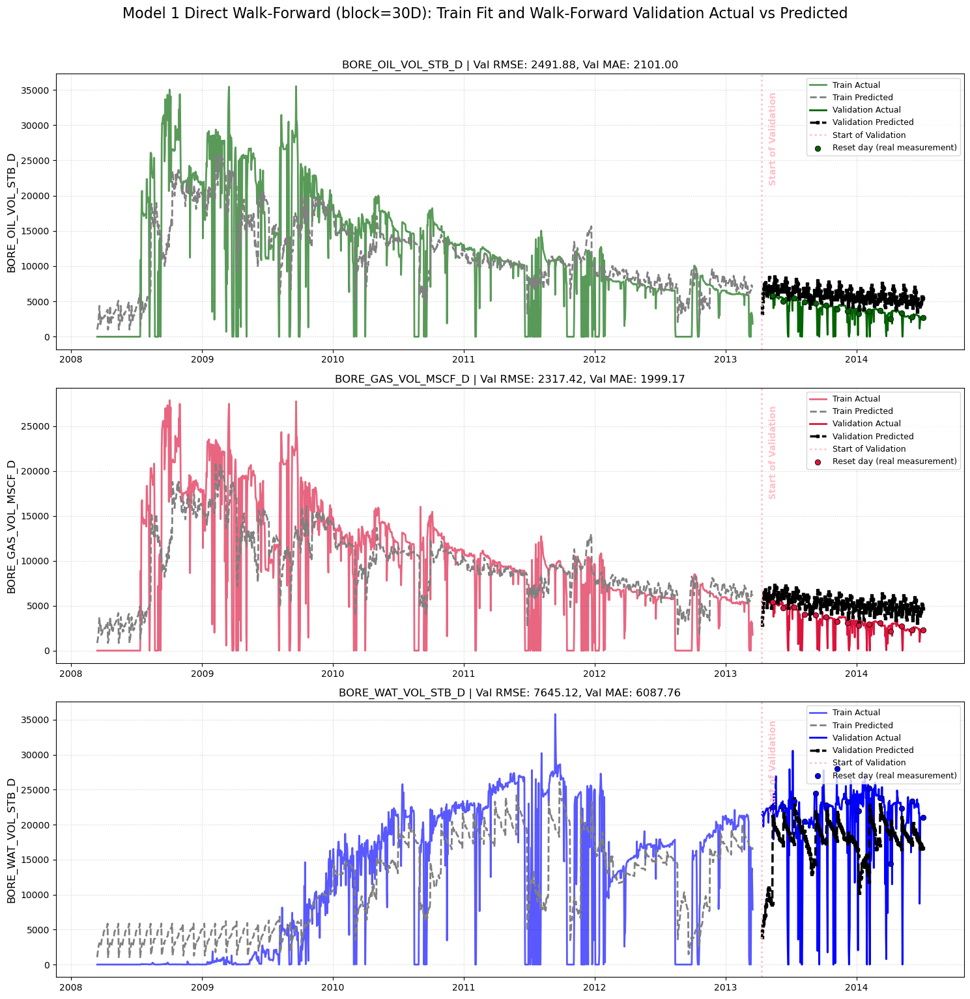

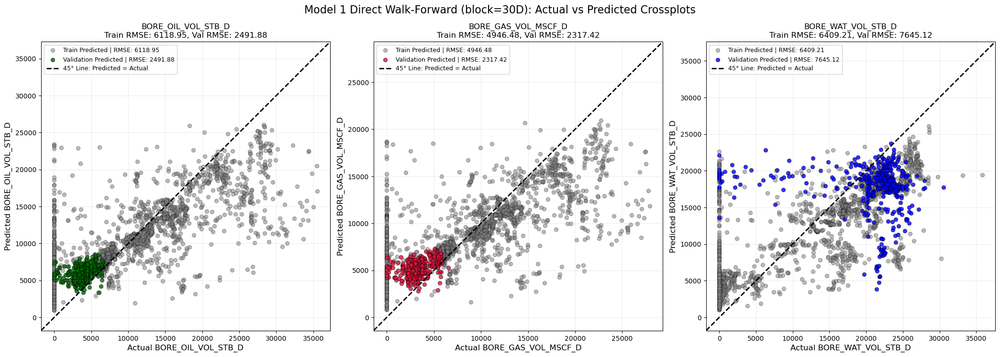

,Model,Block_Horizon,Phase,Train_RMSE,Train_MAE,Train_R2,Val_Daily_RMSE,Val_Daily_MAE,Val_Daily_R2,Val_EndOfBlock_RMSE,Val_EndOfBlock_MAE,Val_EndOfBlock_R2
0,Model 1 Direct Walk-Forward,1,BORE_OIL_VOL_STB_D,4387.943499,2568.901123,0.732847,1663.857514,1333.094970,-0.382196,1663.857514,1333.094970,-0.382196
1,Model 1 Direct Walk-Forward,1,BORE_GAS_VOL_MSCF_D,3517.212450,2069.153652,0.723667,1378.318434,1090.030342,-0.097356,1378.318434,1090.030342,-0.097356
2,Model 1 Direct Walk-Forward,1,BORE_WAT_VOL_STB_D,4481.606255,2617.045177,0.791264,6053.018618,3869.185491,-0.138109,6053.018618,3869.185491,-0.138109
3,Model 1 Direct Walk-Forward,7,BORE_OIL_VOL_STB_D,5173.997601,3408.441206,0.627598,2777.199102,2396.347831,-2.846885,4030.959439,3790.950735,-6.165186
4,Model 1 Direct Walk-Forward,7,BORE_GAS_VOL_MSCF_D,4157.015808,2760.166664,0.612846,2349.954588,2010.261980,-2.186379,3403.319692,3178.163989,-5.027599
5,Model 1 Direct Walk-Forward,7,BORE_WAT_VOL_STB_D,5363.952669,3588.708274,0.700950,6661.947329,4732.899260,-0.375875,7355.678263,5651.229508,-0.401996
6,Model 1 Direct Walk-Forward,14,BORE_OIL_VOL_STB_D,5343.842496,3571.342432,0.602747,2784.266580,2386.026983,-2.845607,1744.556963,1214.546293,-0.290310
7,Model 1 Direct Walk-Forward,14,BORE_GAS_VOL_MSCF_D,4325.756708,2943.441000,0.580777,2531.396057,2205.482895,-2.674054,1647.031090,1218.685097,-0.342323
8,Model 1 Direct Walk-Forward,14,BORE_WAT_VOL_STB_D,6003.968797,4244.311143,0.625328,6970.889465,5216.826175,-0.487380,7611.384736,6084.782207,-0.420039
9,Model 1 Direct Walk-Forward,30,BORE_OIL_VOL_STB_D,6118.953323,4158.969674,0.479820,2491.880722,2100.998028,-2.044592,2184.140425,2076.957098,-3.863767


In [63]:
from Direct_Horizon_Model1_helper_functions import plot_model1_train_val_diagnostics

model1_metrics = []

for block_horizon in model1_block_horizons:
    metrics_df = plot_model1_train_val_diagnostics(
        train_daily_results_df=model1_train_daily_results[block_horizon],
        val_daily_results_df=model1_val_daily_results[block_horizon],
        block_horizon=block_horizon,
        model_name="Model 1 Direct Walk-Forward",
        start_of_val_date=val_data.index.min(),
    )
    model1_metrics.append(metrics_df)

model1_metrics_df = pd.concat(model1_metrics, ignore_index=True)
model1_metrics_df

## LightGBM (linear tree) comparison

Same Model 1 architecture -- one model per (phase, horizon), deployed via periodic-reset walk-forward, no recursion -- swapping the Lasso `model_builder` for a conservative, linear-tree LightGBM (`build_single_phase_lightgbm_grid`). `linear_tree=True` fits a linear regression at each leaf instead of a constant, so it can fit a different local slope per leaf rather than only ever echoing a weighted combination of past lags -- aimed at the trend-extrapolation weakness Lasso has on a steadily-moving series like water.

Tuning is deliberately conservative given ~650-700 training rows per horizon: num_leaves capped at 3/5/7, min_child_samples 50/100 so each leaf's linear fit has enough rows to be stable, low learning_rate (0.05) and modest n_estimators (150) rather than a large boosted ensemble. Walk-forward/plotting code is unchanged from the Lasso run above -- only the trained models differ.

In [64]:
import functools

from Direct_Horizon_Model0_helper_functions import build_single_phase_lightgbm_grid

model1_horizon_results_lgbm, _model1_horizon_metrics_df_lgbm = run_model0_horizon_sweep(
    df=df,
    train_data=train_data,
    val_data=val_data,
    horizons=model1_horizons,
    sensor_variables=SENSOR_VARIABLES,
    future_known_variables=FUTURE_KNOWN_VARIABLES,
    n_splits=10,
    model_builder=functools.partial(build_single_phase_lightgbm_grid, n_splits=10),
    verbose=False,
)

models_by_horizon_lgbm = {
    h: model1_horizon_results_lgbm[h]["models"] for h in model1_horizons
}

model1_train_daily_results_lgbm = {}
model1_val_daily_results_lgbm = {}

for block_horizon in model1_block_horizons:
    train_daily_df, _train_eob_df = run_model1_direct_walk_forward(
        models_by_horizon=models_by_horizon_lgbm,
        df=df,
        simulation_data=train_data,
        block_horizon=block_horizon,
        sensor_variables=SENSOR_VARIABLES,
        future_known_variables=FUTURE_KNOWN_VARIABLES,
        verbose=False,
    )
    val_daily_df, _val_eob_df = run_model1_direct_walk_forward(
        models_by_horizon=models_by_horizon_lgbm,
        df=df,
        simulation_data=val_data,
        block_horizon=block_horizon,
        sensor_variables=SENSOR_VARIABLES,
        future_known_variables=FUTURE_KNOWN_VARIABLES,
        verbose=False,
    )

    model1_train_daily_results_lgbm[block_horizon] = train_daily_df
    model1_val_daily_results_lgbm[block_horizon] = val_daily_df

## Diagnostics per block length (LightGBM)

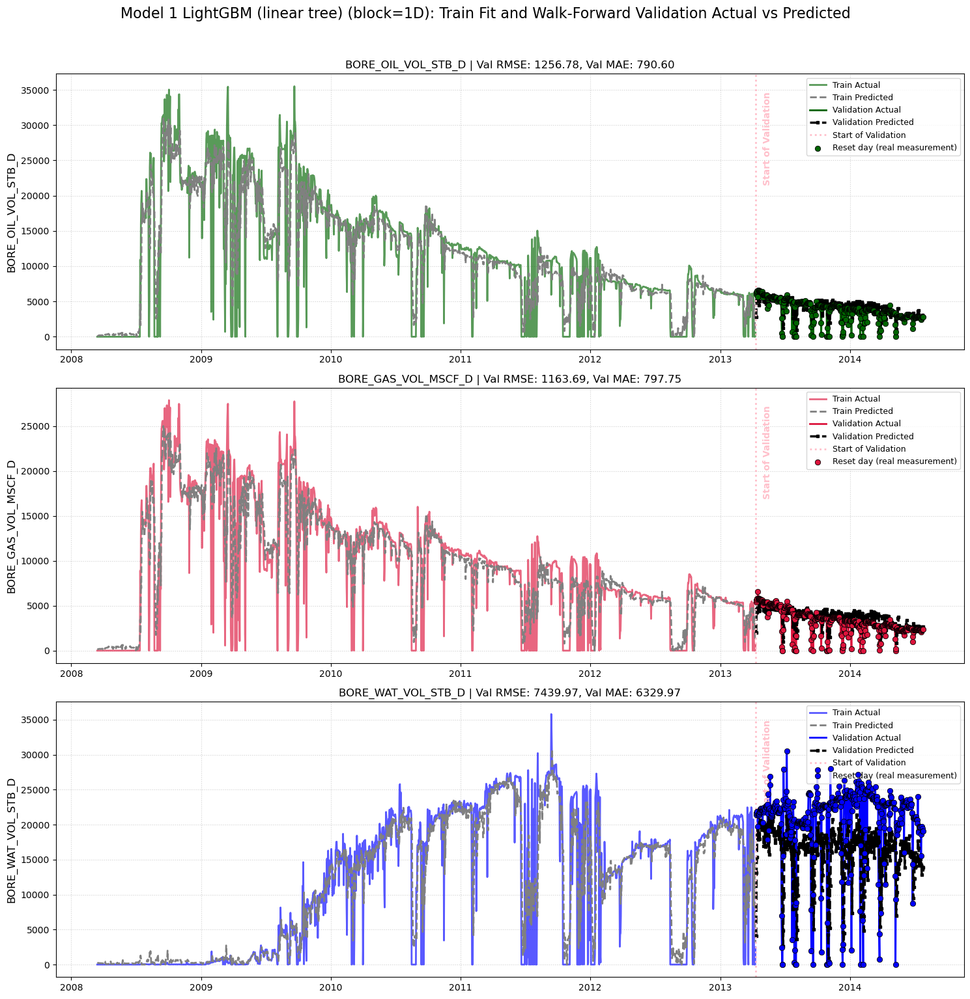

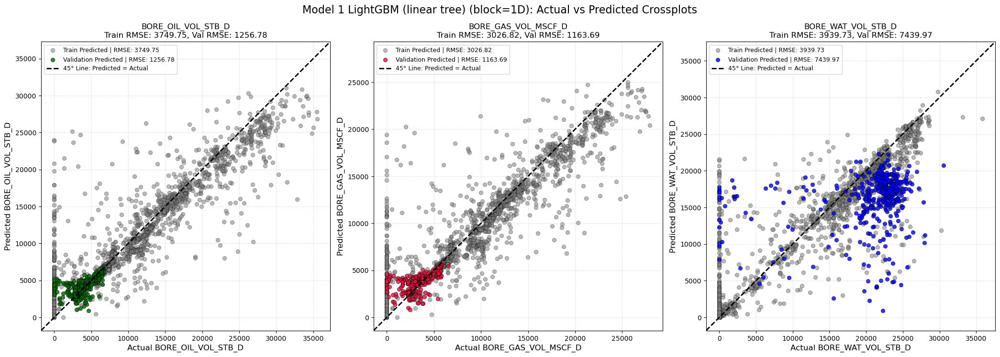

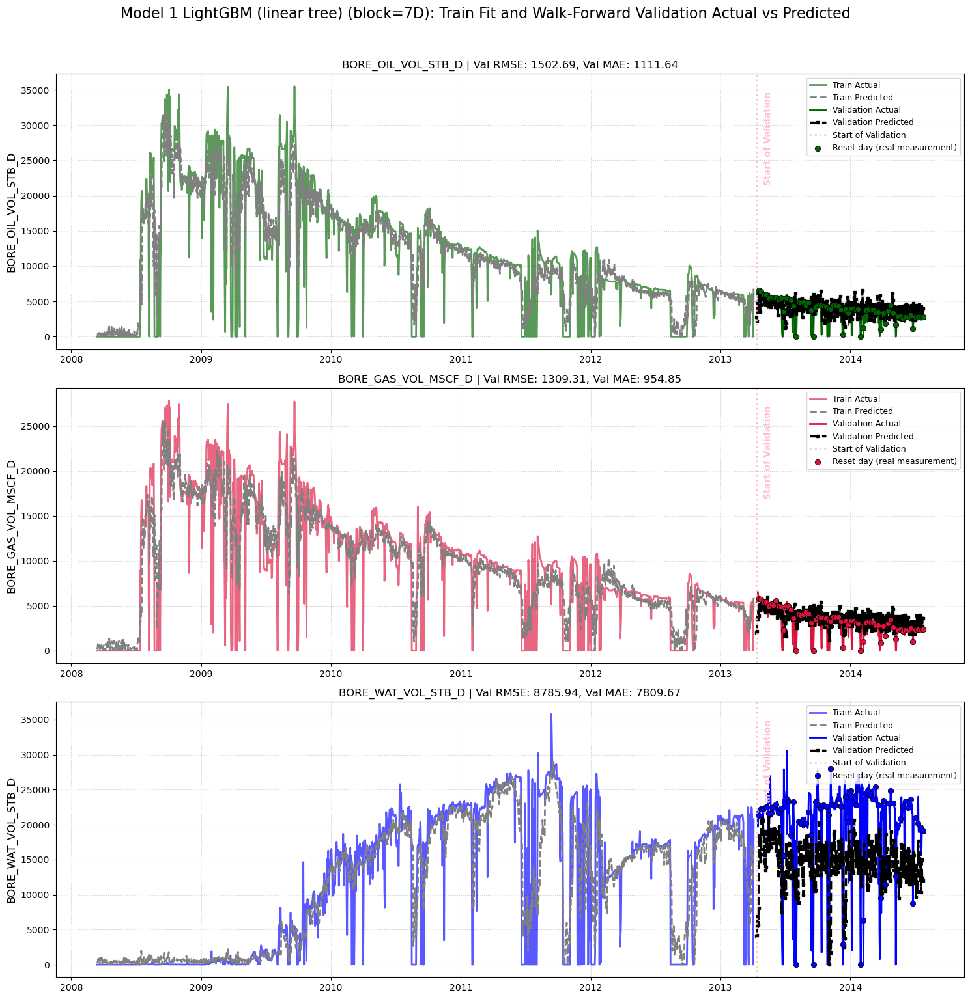

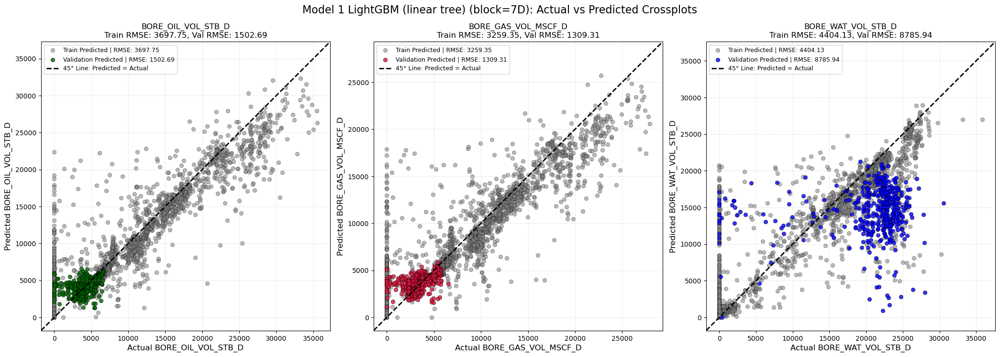

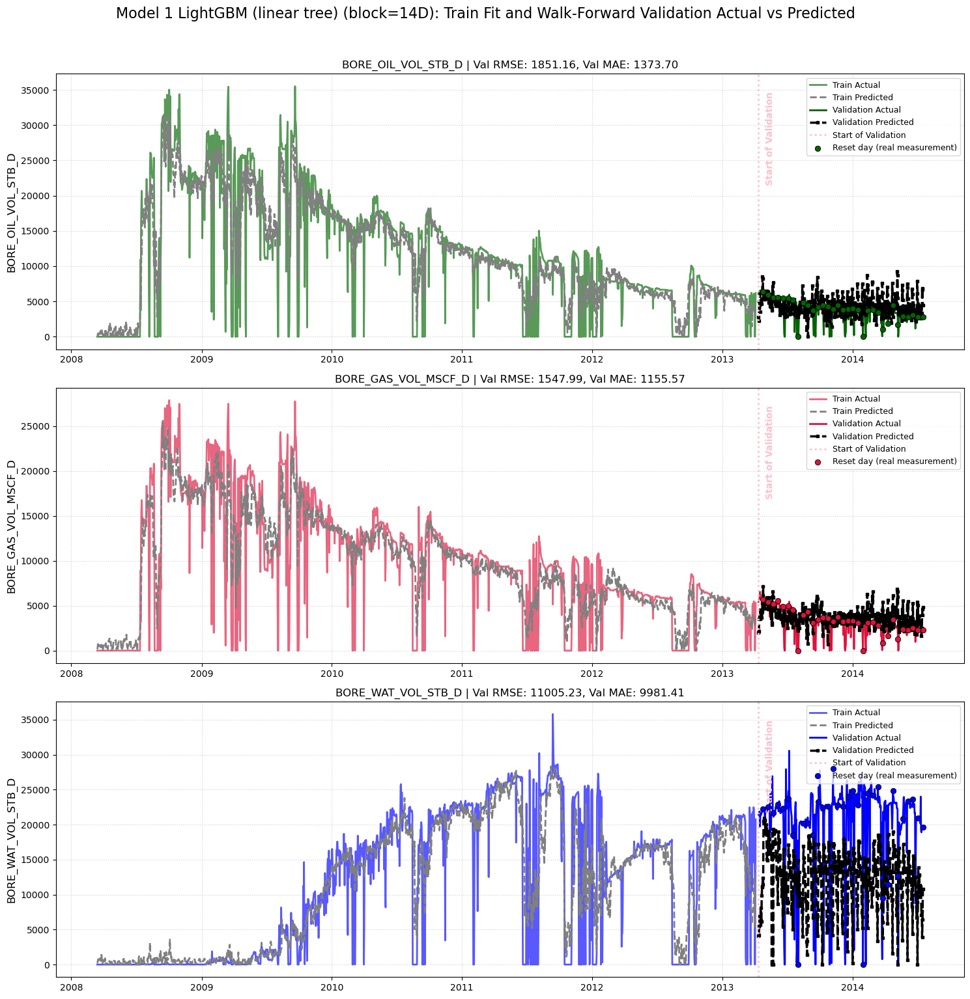

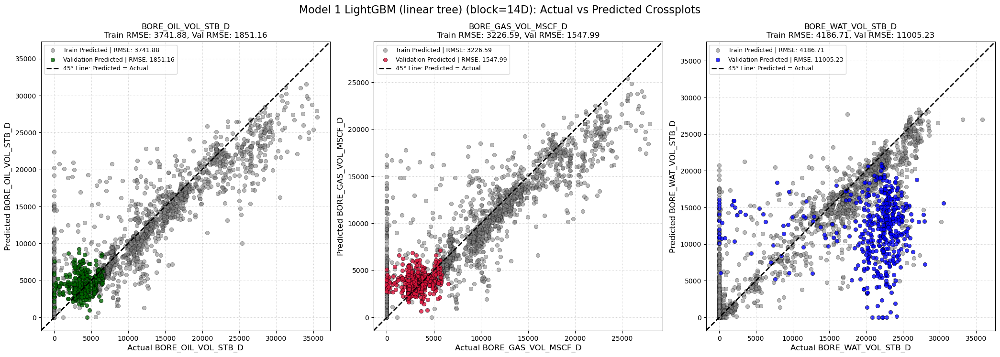

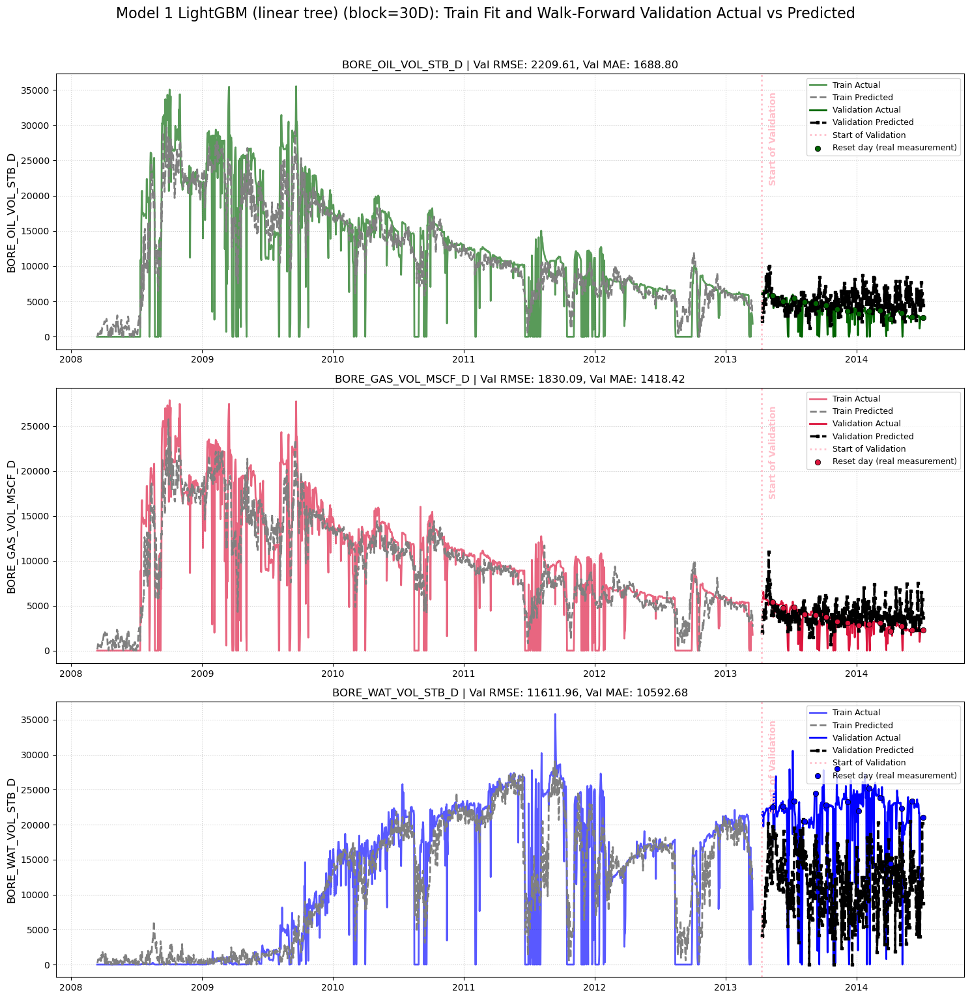

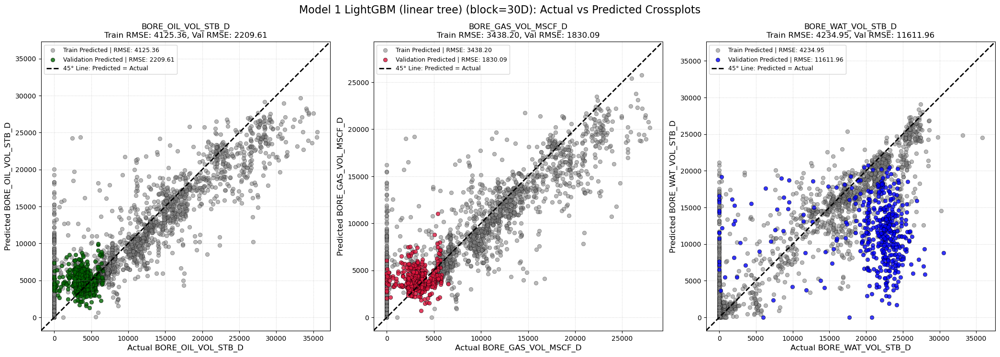

,Model,Block_Horizon,Phase,Train_RMSE,Train_MAE,Train_R2,Val_Daily_RMSE,Val_Daily_MAE,Val_Daily_R2,Val_EndOfBlock_RMSE,Val_EndOfBlock_MAE,Val_EndOfBlock_R2
0,Model 1 LightGBM (linear tree),1,BORE_OIL_VOL_STB_D,3749.750523,2158.249424,0.804907,1256.777792,790.600135,0.211405,1256.777792,790.600135,0.211405
1,Model 1 LightGBM (linear tree),1,BORE_GAS_VOL_MSCF_D,3026.823196,1765.887545,0.795351,1163.693159,797.751248,0.217787,1163.693159,797.751248,0.217787
2,Model 1 LightGBM (linear tree),1,BORE_WAT_VOL_STB_D,3939.732426,2031.206644,0.838690,7439.974075,6329.970064,-0.719423,7439.974075,6329.970064,-0.719423
3,Model 1 LightGBM (linear tree),7,BORE_OIL_VOL_STB_D,3697.750571,2297.400115,0.809789,1502.693383,1111.644182,-0.126253,1684.418160,1262.530151,-0.251153
4,Model 1 LightGBM (linear tree),7,BORE_GAS_VOL_MSCF_D,3259.354834,2072.325338,0.761996,1309.312188,954.846672,0.010844,1579.395672,1238.993962,-0.298138
5,Model 1 LightGBM (linear tree),7,BORE_WAT_VOL_STB_D,4404.128189,2482.918554,0.798398,8785.939585,7809.666072,-1.393058,9951.091508,9219.234279,-1.565917
6,Model 1 LightGBM (linear tree),14,BORE_OIL_VOL_STB_D,3741.878965,2381.681447,0.805222,1851.155376,1373.700409,-0.699922,2187.143295,1689.742559,-1.028047
7,Model 1 LightGBM (linear tree),14,BORE_GAS_VOL_MSCF_D,3226.594252,2093.179060,0.766756,1547.991583,1155.571771,-0.373924,2378.737188,1968.378822,-1.799925
8,Model 1 LightGBM (linear tree),14,BORE_WAT_VOL_STB_D,4186.712103,2428.515623,0.817812,11005.225135,9981.411354,-2.707179,12343.562711,11643.867955,-2.734685
9,Model 1 LightGBM (linear tree),30,BORE_OIL_VOL_STB_D,4125.360645,2768.897524,0.763559,2209.605958,1688.800912,-1.393891,1141.999790,919.204905,-0.329670


In [65]:
model1_metrics_lgbm = []

for block_horizon in model1_block_horizons:
    metrics_df = plot_model1_train_val_diagnostics(
        train_daily_results_df=model1_train_daily_results_lgbm[block_horizon],
        val_daily_results_df=model1_val_daily_results_lgbm[block_horizon],
        block_horizon=block_horizon,
        model_name="Model 1 LightGBM (linear tree)",
        start_of_val_date=val_data.index.min(),
    )
    model1_metrics_lgbm.append(metrics_df)

model1_metrics_lgbm_df = pd.concat(model1_metrics_lgbm, ignore_index=True)
model1_metrics_lgbm_df

## Lasso vs. LightGBM (linear tree) -- MAE / RMSE

In [66]:
comparison_cols = ["Model", "Block_Horizon", "Phase", "Val_Daily_MAE", "Val_Daily_RMSE",
                    "Val_EndOfBlock_MAE", "Val_EndOfBlock_RMSE"]

model1_algorithm_comparison_df = pd.concat(
    [model1_metrics_df[comparison_cols], model1_metrics_lgbm_df[comparison_cols]],
    ignore_index=True,
).sort_values(["Block_Horizon", "Phase", "Model"])

model1_algorithm_comparison_df

,Model,Block_Horizon,Phase,Val_Daily_MAE,Val_Daily_RMSE,Val_EndOfBlock_MAE,Val_EndOfBlock_RMSE
1,Model 1 Direct Walk-Forward,1,BORE_GAS_VOL_MSCF_D,1090.030342,1378.318434,1090.030342,1378.318434
13,Model 1 LightGBM (linear tree),1,BORE_GAS_VOL_MSCF_D,797.751248,1163.693159,797.751248,1163.693159
0,Model 1 Direct Walk-Forward,1,BORE_OIL_VOL_STB_D,1333.094970,1663.857514,1333.094970,1663.857514
12,Model 1 LightGBM (linear tree),1,BORE_OIL_VOL_STB_D,790.600135,1256.777792,790.600135,1256.777792
2,Model 1 Direct Walk-Forward,1,BORE_WAT_VOL_STB_D,3869.185491,6053.018618,3869.185491,6053.018618
14,Model 1 LightGBM (linear tree),1,BORE_WAT_VOL_STB_D,6329.970064,7439.974075,6329.970064,7439.974075
4,Model 1 Direct Walk-Forward,7,BORE_GAS_VOL_MSCF_D,2010.261980,2349.954588,3178.163989,3403.319692
16,Model 1 LightGBM (linear tree),7,BORE_GAS_VOL_MSCF_D,954.846672,1309.312188,1238.993962,1579.395672
3,Model 1 Direct Walk-Forward,7,BORE_OIL_VOL_STB_D,2396.347831,2777.199102,3790.950735,4030.959439
15,Model 1 LightGBM (linear tree),7,BORE_OIL_VOL_STB_D,1111.644182,1502.693383,1262.530151,1684.418160
